# W-net Unsupervised find the best optimizer  and initializers

Having stated creating the W-net from an implemented U-net arcitecture we started with using adam as an optimizer and He Normal as a kernel initializer. In addition, from notebook W_net_Unsupervised_&_Centroid_Loss_1_2 we have conclude that the best architecture is W-net 18-32.  In this notebook we will test if there is any better optimizer or initializer that could work better in this arcitecture. 

## Download Data from Google Drive

In [1]:
from google.colab import files
from google.colab import auth
auth.authenticate_user()

In [2]:
def importFromDrive(filename, nameId):
  import io
  from googleapiclient.http import MediaIoBaseDownload, MediaFileUpload
  
  from googleapiclient.discovery import build
  drive_service = build('drive', 'v3')
  
  request = drive_service.files().get_media(fileId=nameId)
  variable = io.FileIO(filename, 'wb')
  downloader = MediaIoBaseDownload(variable, request)
  done = False
  while done is False:
    # _ is a placeholder for a progress object that we ignore.
    # (Our file is small, so we skip reporting progress.)
    _, done = downloader.next_chunk()

  variable.seek(0)

In [3]:
importFromDrive('trainSet.mat', '19vro2YKFiURqqmFGYYIx0ZDkirn4F9mk')
importFromDrive('testSet.mat', '1Gmb5aFWuR8kmfDjulgN2h90FutCxQVmF')
importFromDrive('original.zip', '16ibmmBvAYsw9ztlO6KpccQDAzvulEADX')
importFromDrive('segmented_onehot.zip', '16b1Xej2t3XqpyaaxJIa9VT0jsUurtXvY')
importFromDrive('classes.csv', '1V34MJgrbcRkoZBFdI-JuVtyAVAx39Oac')

In [4]:
!rm -r data/original data
!unzip original.zip -d data/
!unzip segmented_onehot.zip -d data/

rm: cannot remove 'data/original': No such file or directory
rm: cannot remove 'data': No such file or directory
Archive:  original.zip
   creating: data/original/
  inflating: data/original/20151127_114556.jpg  
  inflating: data/original/20151127_114946.jpg  
  inflating: data/original/20151127_115133.jpg  
  inflating: data/original/20151127_115151.jpg  
  inflating: data/original/20151127_115229.jpg  
  inflating: data/original/20151127_115424.jpg  
  inflating: data/original/20151127_115553.jpg  
  inflating: data/original/20151127_115951.jpg  
  inflating: data/original/20151127_120002.jpg  
  inflating: data/original/20151127_120128.jpg  
  inflating: data/original/20151127_120156.jpg  
  inflating: data/original/20151127_120208.jpg  
  inflating: data/original/20151127_120446.jpg  
  inflating: data/original/20151127_120643.jpg  
  inflating: data/original/20151127_120723.jpg  
  inflating: data/original/20151127_120755.jpg  
  inflating: data/original/20151127_120831.jpg  
  i


  inflating: data/original/20151127_131055.jpg  
  inflating: data/original/20151127_131106.jpg  
  inflating: data/original/20151127_131130.jpg  
  inflating: data/original/20151127_131150.jpg  
  inflating: data/original/20151127_131209.jpg  
  inflating: data/original/20151127_131259.jpg  
  inflating: data/original/20151127_131420.jpg  
  inflating: data/original/20151127_131439.jpg  
  inflating: data/original/20151127_131450.jpg  
  inflating: data/original/20151127_131553.jpg  
  inflating: data/original/20151127_131604.jpg  
  inflating: data/original/20151127_131713.jpg  
  inflating: data/original/20151127_131721.jpg  
  inflating: data/original/20151127_131751.jpg  
  inflating: data/original/20151127_131812.jpg  
  inflating: data/original/20151127_131828.jpg  
  inflating: data/original/20151127_131839.jpg  
  inflating: data/original/20151127_131852.jpg  
  inflating: data/original/20151127_131933.jpg  
  inflating: data/original/20151127_131948.jpg  
  inflating: data/o


  inflating: data/original/20151130_114733.jpg  
  inflating: data/original/20151130_114818.jpg  
  inflating: data/original/20151130_114838.jpg  
  inflating: data/original/20151130_114910.jpg  
  inflating: data/original/20151130_114923.jpg  
  inflating: data/original/20151130_114930.jpg  
  inflating: data/original/20151130_114939.jpg  
  inflating: data/original/20151130_115044.jpg  
  inflating: data/original/20151130_115054.jpg  
  inflating: data/original/20151130_115115.jpg  
  inflating: data/original/20151130_115127.jpg  
  inflating: data/original/20151130_115202.jpg  
  inflating: data/original/20151130_115239.jpg  
  inflating: data/original/20151130_115259.jpg  
  inflating: data/original/20151130_115311.jpg  
  inflating: data/original/20151130_115339.jpg  
  inflating: data/original/20151130_115408.jpg  
  inflating: data/original/20151130_115502.jpg  
  inflating: data/original/20151130_115542.jpg  
  inflating: data/original/20151130_115557.jpg  
  inflating: data/o


  inflating: data/original/20151203_124739.jpg  
  inflating: data/original/20151203_124827.jpg  
  inflating: data/original/20151203_124903.jpg  
  inflating: data/original/20151203_124923.jpg  
  inflating: data/original/20151203_125059.jpg  
  inflating: data/original/20151203_125110.jpg  
  inflating: data/original/20151203_125225.jpg  
  inflating: data/original/20151203_125246.jpg  
  inflating: data/original/20151203_125258.jpg  
  inflating: data/original/20151203_125317.jpg  
  inflating: data/original/20151203_125620.jpg  
  inflating: data/original/20151203_125638.jpg  
  inflating: data/original/20151203_125657.jpg  
  inflating: data/original/20151203_130030.jpg  
  inflating: data/original/20151203_130529.jpg  
  inflating: data/original/20151203_130542.jpg  
  inflating: data/original/20151203_130620.jpg  
  inflating: data/original/20151203_130633.jpg  
  inflating: data/original/20151203_130658.jpg  
  inflating: data/original/20151203_130726.jpg  
  inflating: data/o


  inflating: data/original/20151204_121406.jpg  
  inflating: data/original/20151204_121427.jpg  
  inflating: data/original/20151204_121452.jpg  
  inflating: data/original/20151204_121506.jpg  
  inflating: data/original/20151204_121520.jpg  
  inflating: data/original/20151204_121602.jpg  
  inflating: data/original/20151204_121641.jpg  
  inflating: data/original/20151204_121736.jpg  
  inflating: data/original/20151204_121844.jpg  
  inflating: data/original/20151204_121904.jpg  
  inflating: data/original/20151204_121926.jpg  
  inflating: data/original/20151204_121940.jpg  
  inflating: data/original/20151204_122112.jpg  
  inflating: data/original/20151204_122143.jpg  
  inflating: data/original/20151204_122251.jpg  
  inflating: data/original/20151204_122308.jpg  
  inflating: data/original/20151204_122327.jpg  
  inflating: data/original/20151204_122434.jpg  
  inflating: data/original/20151204_122447.jpg  
  inflating: data/original/20151204_122501.jpg  
  inflating: data/o


  inflating: data/original/20151204_131821.jpg  
  inflating: data/original/20151204_131845.jpg  
  inflating: data/original/20151204_131904.jpg  
  inflating: data/original/20151204_131917.jpg  
  inflating: data/original/20151204_132001.jpg  
  inflating: data/original/20151204_132014.jpg  
  inflating: data/original/20151204_132033.jpg  
  inflating: data/original/20151204_132059.jpg  
  inflating: data/original/20151204_132116.jpg  
  inflating: data/original/20151204_132129.jpg  
  inflating: data/original/20151204_132219.jpg  
  inflating: data/original/20151204_132239.jpg  
  inflating: data/original/20151204_132306.jpg  
  inflating: data/original/20151204_132341.jpg  
  inflating: data/original/20151204_132424.jpg  
  inflating: data/original/20151204_132509.jpg  
  inflating: data/original/20151204_132523.jpg  
  inflating: data/original/20151204_132542.jpg  
  inflating: data/original/20151204_132616.jpg  
  inflating: data/original/20151204_132641.jpg  
  inflating: data/o


  inflating: data/original/20151211_121210.jpg  
  inflating: data/original/20151211_121244.jpg  
  inflating: data/original/20151211_121353.jpg  
  inflating: data/original/20151211_121401.jpg  
  inflating: data/original/20151211_121425.jpg  
  inflating: data/original/20151211_121527.jpg  
  inflating: data/original/20151211_121641.jpg  
  inflating: data/original/20151211_121712.jpg  
  inflating: data/original/20151211_121727.jpg  
  inflating: data/original/20151211_121749.jpg  
  inflating: data/original/20151211_121903.jpg  
  inflating: data/original/20151211_121925.jpg  
  inflating: data/original/20151211_121939.jpg  
  inflating: data/original/20151211_121957.jpg  
  inflating: data/original/20151211_122012.jpg  
  inflating: data/original/20151211_122045.jpg  
  inflating: data/original/20151211_122103.jpg  
  inflating: data/original/20151211_122133.jpg  
  inflating: data/original/20151211_122152.jpg  
  inflating: data/original/20151211_122231.jpg  
  inflating: data/o


  inflating: data/original/20151211_131744.jpg  
  inflating: data/original/20151211_131844.jpg  
  inflating: data/original/20151211_131911.jpg  
  inflating: data/original/20151211_131940.jpg  
  inflating: data/original/20151211_132005.jpg  
  inflating: data/original/20151211_132013.jpg  
  inflating: data/original/20151211_132029.jpg  
  inflating: data/original/20151211_132138.jpg  
  inflating: data/original/20151211_132154.jpg  
  inflating: data/original/20151211_132209.jpg  
  inflating: data/original/20151211_132238.jpg  
  inflating: data/original/20151211_132304.jpg  
  inflating: data/original/20151211_132332.jpg  
  inflating: data/original/20151211_132350.jpg  
  inflating: data/original/20151211_132412.jpg  
  inflating: data/original/20151211_132442.jpg  
  inflating: data/original/20151211_132514.jpg  
  inflating: data/original/20151211_132539.jpg  
  inflating: data/original/20151211_132631.jpg  
  inflating: data/original/20151211_132746.jpg  
  inflating: data/o


  inflating: data/original/20151211_142954.jpg  
  inflating: data/original/20151211_143008.jpg  
  inflating: data/original/20151221_113328.jpg  
  inflating: data/original/20151221_113350.jpg  
  inflating: data/original/20151221_113404.jpg  
  inflating: data/original/20151221_113425.jpg  
  inflating: data/original/20151221_113511.jpg  
  inflating: data/original/20151221_113608.jpg  
  inflating: data/original/20151221_113726.jpg  
  inflating: data/original/20151221_113855.jpg  
  inflating: data/original/20151221_114009.jpg  
  inflating: data/original/20151221_114335.jpg  
  inflating: data/original/20151221_114354.jpg  
  inflating: data/original/20151221_114406.jpg  
  inflating: data/original/20151221_114415.jpg  
  inflating: data/original/20151221_114428.jpg  
  inflating: data/original/20151221_114603.jpg  
  inflating: data/original/20151221_114732.jpg  
  inflating: data/original/20151221_114930.jpg  
  inflating: data/original/20151221_115117.jpg  
  inflating: data/o


  inflating: data/original/20151221_124359.jpg  
  inflating: data/original/20151221_124514.jpg  
  inflating: data/original/20151221_124614.jpg  
  inflating: data/original/20151221_124643.jpg  
  inflating: data/original/20151221_124714.jpg  
  inflating: data/original/20151221_124736.jpg  
  inflating: data/original/20151221_124752.jpg  
  inflating: data/original/20151221_124819.jpg  
  inflating: data/original/20151221_124849.jpg  
  inflating: data/original/20151221_124906.jpg  
  inflating: data/original/20151221_124934.jpg  
  inflating: data/original/20151221_125054.jpg  
  inflating: data/original/20151221_125112.jpg  
  inflating: data/original/20151221_125211.jpg  
  inflating: data/original/20151221_125231.jpg  
  inflating: data/original/20151221_125255.jpg  
  inflating: data/original/20151221_125333.jpg  
  inflating: data/original/20151221_125345.jpg  
  inflating: data/original/20151221_125430.jpg  
  inflating: data/original/20151221_125455.jpg  
  inflating: data/o


  inflating: data/original/20151221_135001.jpg  
  inflating: data/original/20151221_135010.jpg  
  inflating: data/original/20151221_135021.jpg  
  inflating: data/original/20151221_135140.jpg  
  inflating: data/original/20151221_135153.jpg  
  inflating: data/original/20151221_135231.jpg  
  inflating: data/original/20151221_135433.jpg  
  inflating: data/original/20151221_135642.jpg  
Archive:  segmented_onehot.zip
   creating: data/segmented_onehot/
   creating: data/segmented_onehot/20151127_114556/
  inflating: data/segmented_onehot/20151127_114556/pasta_mare_e_monti.png  
  inflating: data/segmented_onehot/20151127_114556/patate_pure.png  
   creating: data/segmented_onehot/20151127_114946/
  inflating: data/segmented_onehot/20151127_114946/budino.png  
  inflating: data/segmented_onehot/20151127_114946/mandarini.png  
  inflating: data/segmented_onehot/20151127_114946/pasta_mare_e_monti.png  
  inflating: data/segmented_onehot/20151127_114946/pizza.png  
   creating: data/seg


   creating: data/segmented_onehot/20151127_132932/
  inflating: data/segmented_onehot/20151127_132932/pane.png  
  inflating: data/segmented_onehot/20151127_132932/pasta_mare_e_monti.png  
   creating: data/segmented_onehot/20151127_132952/
  inflating: data/segmented_onehot/20151127_132952/fagiolini.png  
  inflating: data/segmented_onehot/20151127_132952/pane.png  
  inflating: data/segmented_onehot/20151127_132952/pasta_bianco.png  
  inflating: data/segmented_onehot/20151127_132952/torta_salata_spinaci_e_ricotta.png  
  inflating: data/segmented_onehot/20151127_132952/yogurt.png  
   creating: data/segmented_onehot/20151127_133052/
  inflating: data/segmented_onehot/20151127_133052/cotoletta.png  
  inflating: data/segmented_onehot/20151127_133052/pane.png  
  inflating: data/segmented_onehot/20151127_133052/pasta_mare_e_monti.png  
  inflating: data/segmented_onehot/20151127_133052/patate_pure.png  
   creating: data/segmented_onehot/20151127_133109/
  inflating: data/segmented_


  inflating: data/segmented_onehot/20151130_121453/pane.png  
  inflating: data/segmented_onehot/20151130_121453/pasta_ricotta_e_salsiccia.png  
  inflating: data/segmented_onehot/20151130_121453/patate_pure.png  
   creating: data/segmented_onehot/20151130_121522/
  inflating: data/segmented_onehot/20151130_121522/pasta_tonno_e_piselli.png  
  inflating: data/segmented_onehot/20151130_121522/piselli.png  
  inflating: data/segmented_onehot/20151130_121522/torta_salata_spinaci_e_ricotta.png  
   creating: data/segmented_onehot/20151130_121536/
  inflating: data/segmented_onehot/20151130_121536/cotoletta.png  
  inflating: data/segmented_onehot/20151130_121536/pasta_ricotta_e_salsiccia.png  
  inflating: data/segmented_onehot/20151130_121536/piselli.png  
   creating: data/segmented_onehot/20151130_121548/
  inflating: data/segmented_onehot/20151130_121548/pasta_ricotta_e_salsiccia.png  
   creating: data/segmented_onehot/20151130_121600/
  inflating: data/segmented_onehot/20151130_121


  inflating: data/segmented_onehot/20151204_121844/zucchine_umido.png  
   creating: data/segmented_onehot/20151204_121904/
  inflating: data/segmented_onehot/20151204_121904/cotoletta.png  
  inflating: data/segmented_onehot/20151204_121904/orecchiette_(ragu).png  
  inflating: data/segmented_onehot/20151204_121904/pane.png  
  inflating: data/segmented_onehot/20151204_121904/yogurt.png  
  inflating: data/segmented_onehot/20151204_121904/zucchine_umido.png  
   creating: data/segmented_onehot/20151204_121926/
  inflating: data/segmented_onehot/20151204_121926/carote.png  
  inflating: data/segmented_onehot/20151204_121926/cotoletta.png  
  inflating: data/segmented_onehot/20151204_121926/lasagna_alla_bolognese.png  
  inflating: data/segmented_onehot/20151204_121926/pane.png  
   creating: data/segmented_onehot/20151204_121940/
  inflating: data/segmented_onehot/20151204_121940/cotoletta.png  
  inflating: data/segmented_onehot/20151204_121940/lasagna_alla_bolognese.png  
  inflatin


  inflating: data/segmented_onehot/20151211_114929/budino.png  
  inflating: data/segmented_onehot/20151211_114929/pasta_cozze_e_vongole.png  
  inflating: data/segmented_onehot/20151211_114929/patate_pure.png  
  inflating: data/segmented_onehot/20151211_114929/spinaci.png  
   creating: data/segmented_onehot/20151211_115005/
  inflating: data/segmented_onehot/20151211_115005/pane.png  
  inflating: data/segmented_onehot/20151211_115005/pasta_cozze_e_vongole.png  
  inflating: data/segmented_onehot/20151211_115005/patatine_fritte.png  
   creating: data/segmented_onehot/20151211_115030/
  inflating: data/segmented_onehot/20151211_115030/cotoletta.png  
  inflating: data/segmented_onehot/20151211_115030/pasta_cozze_e_vongole.png  
   creating: data/segmented_onehot/20151211_115104/
  inflating: data/segmented_onehot/20151211_115104/banane.png  
  inflating: data/segmented_onehot/20151211_115104/cotoletta.png  
  inflating: data/segmented_onehot/20151211_115104/fagiolini.png  
  inflat


   creating: data/segmented_onehot/20151211_131744/
  inflating: data/segmented_onehot/20151211_131744/pane.png  
  inflating: data/segmented_onehot/20151211_131744/patate_pure.png  
  inflating: data/segmented_onehot/20151211_131744/riso_bianco.png  
   creating: data/segmented_onehot/20151211_131844/
  inflating: data/segmented_onehot/20151211_131844/carote.png  
  inflating: data/segmented_onehot/20151211_131844/pasta_pesto_besciamella_e_cornetti.png  
   creating: data/segmented_onehot/20151211_131911/
  inflating: data/segmented_onehot/20151211_131911/fagiolini.png  
  inflating: data/segmented_onehot/20151211_131911/mandarini.png  
  inflating: data/segmented_onehot/20151211_131911/medaglioni_di_carne.png  
  inflating: data/segmented_onehot/20151211_131911/pane.png  
  inflating: data/segmented_onehot/20151211_131911/pasta_cozze_e_vongole.png  
   creating: data/segmented_onehot/20151211_131940/
  inflating: data/segmented_onehot/20151211_131940/banane.png  
  inflating: data/s

  inflating: data/segmented_onehot/20151221_120510/pizza.png  
  inflating: data/segmented_onehot/20151221_120510/torta_crema_2.png  
   creating: data/segmented_onehot/20151221_120520/
  inflating: data/segmented_onehot/20151221_120520/arancia.png  
  inflating: data/segmented_onehot/20151221_120520/insalata_mista.png  
  inflating: data/segmented_onehot/20151221_120520/pane.png  
  inflating: data/segmented_onehot/20151221_120520/scaloppine.png  
   creating: data/segmented_onehot/20151221_120547/
  inflating: data/segmented_onehot/20151221_120547/riso_bianco.png  
   creating: data/segmented_onehot/20151221_120613/
  inflating: data/segmented_onehot/20151221_120613/pane.png  
  inflating: data/segmented_onehot/20151221_120613/pasta_sugo_pesce.png  
   creating: data/segmented_onehot/20151221_120655/
  inflating: data/segmented_onehot/20151221_120655/pasta_sugo_vegetariano.png  
  inflating: data/segmented_onehot/20151221_120655/scaloppine.png  
   creating: data/segmented_onehot/201

## Libraries import 

In [5]:
import scipy.io
import keras
from keras import losses
from keras.layers.convolutional import Conv2D ,SeparableConv2D 
import os
import random
import sys
import warnings
import numpy as np
import pandas as pd
from itertools import chain
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from keras.utils import Progbar
from keras.models import Model, load_model
from keras.layers import Input
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose,Convolution2D
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras import backend as K
from keras.callbacks import ModelCheckpoint
import tensorflow as tf
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore', category=UserWarning, module='skimage')
from skimage import data, segmentation, color
from skimage.future import graph
from matplotlib import pyplot as plt
import scipy.misc
from skimage import io; io.use_plugin('matplotlib')
from skimage.measure import label
import sklearn.preprocessing
from mpl_toolkits.mplot3d import Axes3D
from keras.backend import int_shape
from keras import backend as K
from scipy import sparse
from skimage import img_as_bool
import cv2
# Setting seed for reproducability
seed = 42
random.seed = seed
np.random.seed = seed

Using TensorFlow backend.


## Data preperation

In [6]:
train_ids = scipy.io.loadmat('trainSet.mat', squeeze_me=True)
test_ids = scipy.io.loadmat('testSet.mat', squeeze_me=True)
train_ids = train_ids['TrainingSet']
test_ids = test_ids['TestSet']

In [0]:
#creating a array with all the images for training
img = np.zeros((len(train_ids),256,256,3))
for i in range( len(train_ids)):
  im = imread('data/original/' + train_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant')
  img[i] = im

In [7]:
#this cell gives us one image for the one image processing 
img = np.zeros((1,256,256,3))
i=1
im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
im = resize(im, (256, 256), mode='constant')
img[0] = im

In [8]:
classes_ids = pd.read_csv('classes.csv', header=None)
classes_ids = classes_ids.values
classes_ids = classes_ids.squeeze()
total_classes = classes_ids.shape[0]
for i in range(0,classes_ids.shape[0]):
  classes_ids[i] = classes_ids[i].replace('/', '_')

## Loss Functions 

### Centroid loss

In [9]:
###################### centroid loss Function  ###########################

def features_similarity(u,v):
  c1,c2=u[:3],v[:3]
  iu,ju=u[3],u[4]
  iv,jv=v[3],v[4]
  
  dx=K.square(iu-iv)+K.square(ju-jv)
  dx=tf.to_float(dx)
  di=K.sum(K.square(c1-c2))
  di=tf.to_float(di)
  sigma_col=tf.to_float(5)#was 10
  sigma_pos=tf.to_float(20)#was 4
  d=di/sigma_col+dx/sigma_pos
  return K.exp(-(d))

def to_features(img):
  X_col=3*img
  X_pos=np.zeros((ROWS,COLS,2))
  for i in range(X_pos.shape[0]):
    X_pos[i,:,0]=float(i+1)/70#ROWS
    X_pos[:,i,1]=float(i+1)/70#COLS
  X_pos=tf.convert_to_tensor(X_pos,dtype='float32')
  
  X=tf.concat([X_col,X_pos],axis=2)
  X=K.reshape(X,(ROWS*COLS,5))
  return X


def features_similarity_matrix(X):
  print('building similarity matrix')
  W=tf.map_fn(elems=X,
              fn=lambda u: 
              tf.map_fn(elems=X,
                        fn=lambda v: 
                        features_similarity(u,v)),
              dtype='float32')
  return W

def mean(X):
  return K.mean(X,axis=0)
def cov(X,Y):
  return mean((X-mean(X))*(Y-mean(X)))
def var(X):
  return cov(X,X)

def wmean(X,w):
  w_sum=K.sum(w)
  return tf.cond(w_sum <= 0., lambda: tf.zeros_like(X[0]), lambda: K.sum(X*tf.expand_dims(w/w_sum, 1),axis=0) )
def wvar(X,w):
  return wmean(K.square(X-wmean(X,w)),w)

def class_ratio_penalty(r,n_classes):
  return tf.to_float(1.)+K.exp(-r*tf.to_float(n_classes)*tf.to_float(200))

def edges_length(P):
  #make the convolution ourselves
  kernel = np.array([[-1,-2,-1],[-2,12,-2],[-1,-2,-1]])
  convolution=K.zeros((ROWS-2,COLS-2,CLASSES))
  for i in range(3):
    ic=i-1#-1,0,1
    for j in range(3):
      jc=j-1#-1,0,1
      convolution+=kernel[i,j]*P[1+ic:ROWS-1+ic,1+jc:COLS-1+jc,:]
  convolution=K.square(convolution)#make it positive and more exagerated
  return K.sum(convolution)/K.sum(P)#sum in all axis

def centroids_similarity_loss(y_true,y_pred):
  img=y_true[0]
  P=y_pred[0]
  X=to_features(img)
  P=tf.reshape(y_pred[0],[ROWS*COLS,CLASSES])
    
  centroids    = tf.map_fn(elems=np.arange(CLASSES), fn=lambda k: wmean(X,P[:,k]),dtype='float32')#each element is a 5 coord vector RGBIJ
  variances    = tf.map_fn(elems=np.arange(CLASSES), fn=lambda k: wvar(X,P[:,k]), dtype='float32')#each element is a 5 coord vector RGBIJ
  class_ratios = tf.map_fn(elems=np.arange(CLASSES), fn=lambda k: mean(P[:,k]),   dtype='float32')#use this to prevent some classes to take over all pixels
  
  loss = tf.to_float(CLASSES, name='loss')
  for k1 in range(CLASSES):
    centroid1=centroids[k1]
    centroid_inter_similarity_mean=tf.to_float(0)
    for k2 in range(k1+1,CLASSES):
      centroid2=centroids[k2]
      centroid_inter_similarity_mean+=features_similarity(centroid1,centroid2)
    loss+=centroid_inter_similarity_mean*class_ratio_penalty(class_ratios[k1],CLASSES)
    centroid_intra_similarity = K.exp(-K.sum(variances[k1]))#variance is the mean squared distance to the centroid, and similarity is exp(-d**2)
    loss-=centroid_intra_similarity/(centroid_intra_similarity+centroid_inter_similarity_mean)#loss/(20*CLASSES*(CLASSES-1)/2)
  
  return (loss +edges_length(tf.reshape(P,(ROWS,COLS,CLASSES))))/(3*CLASSES*(CLASSES-1)/2)


def centroid_similarity_loss_no_variance(y_true,y_pred):
  img=y_true[0]
  P=y_pred[0]
  X=to_features(img)
  P=tf.reshape(y_pred[0],[ROWS*COLS,CLASSES])
  centroids = tf.matmul(tf.transpose(P),X)/tf.matmul(tf.transpose(P),tf.ones((ROWS*COLS,1)))

  loss = tf.to_float(0, name='loss')
  for k1 in range(CLASSES):
    centroid_inter_similarity_mean=tf.to_float(0)
    for k2 in range(k1+1,CLASSES):
      loss+=features_similarity(centroids[k1],centroids[k2])
  return (loss+edges_length(tf.reshape(P,(ROWS,COLS,CLASSES)))) /(CLASSES*(CLASSES-1)/2)

### Initialise the patameters of our loss function

In [10]:
ROWS = 256
COLS = 256
CLASSES = 8
CHANNELS = 3

## Data Visualization and Postprocessing  Functions 

In [22]:
def to_hard_segm_np(P):
  P_hard=np.zeros_like(P)
  for k in range(CLASSES):
    for i in range(ROWS):
      for j in range(COLS):
        P_hard[i,j,np.argmax(P[i,j])]=1
  return P_hard

def to_features_np(img):
  X_col=img
  X_pos=np.zeros((ROWS,COLS,2))
  for i in range(X_pos.shape[0]):
    X_pos[i,:,0]=float(i+1)/ROWS
    X_pos[:,i,1]=float(i+1)/COLS
  
  X=np.concatenate([X_col,X_pos],axis=2)
  X=np.reshape(X,(ROWS*COLS,5))
  return X

def paint_soft_centroid_color(img,P):
  P_vec=P.reshape((ROWS*COLS,P.shape[2]))
  X_np=to_features_np(img)
  centroids = P_vec.T.dot(X_np)/(P_vec.T.dot(np.ones((COLS*ROWS,1))))
  painted_img = np.array([centroids[np.argmax(P_vec[i])][:3] for i in range(ROWS*COLS)]).reshape(ROWS,COLS,CHANNELS)
  return painted_img

def paint_hard_centroid_color(img,P):
  P_hard=to_hard_segm_np(np.reshape(P,(ROWS,COLS,CLASSES)))
  return paint_soft_centroid_color(img,P_hard)

def plot_probabilities(img,P):
  P_vec=P.reshape((ROWS*COLS,CLASSES))
  X_np=to_features_np(img)
  centroids = P_vec.T.dot(X_np)/(P_vec.T.dot(np.ones((COLS*ROWS,1))))
  
  height=20
  plt.figure(figsize=(height,CLASSES*height))
  for k in range(CLASSES):
    plt.subplot(1,CLASSES,k+1)
    class_k_img=np.array([P_vec[i,k] for i in range(ROWS*COLS)]).reshape(ROWS,COLS)
    plt.imshow(class_k_img)
    plt.title('class '+str(k+1)+' probability'),plt.xticks([]), plt.yticks([])
  plt.show()

def plot_winners(img,P):
  P_vec=P.reshape((ROWS*COLS,CLASSES))
  X_np=to_features_np(img)
  centroids = P_vec.T.dot(X_np)/(P_vec.T.dot(np.ones((COLS*ROWS,1))))
  height=20
  plt.figure(figsize=(height,CLASSES*height))
  for k in range(CLASSES):
    plt.subplot(1,CLASSES,k+1)
    class_k_img=np.array([(np.argmax(P_vec[i])==k) for i in range(ROWS*COLS)]).reshape(ROWS,COLS)
    
    plt.imshow(class_k_img)
    plt.title('class '+str(k+1)+' winners'),plt.xticks([]), plt.yticks([])
  plt.show()

'''Post-processing Function'''
def connectivity_split(img,P):
  '''Split each class into as many connected components it has'''
  P_vec=P.reshape((ROWS*COLS,CLASSES))
  P_new_classes=[]
  for k in range(CLASSES):
    #get the pixels where class k has higher probability than the rest of classes
    class_k_img=np.array([(np.argmax(P_vec[i])==k) for i in range(ROWS*COLS)]).reshape(ROWS,COLS)    
    #assign a label to each connected component
    label_array=label(class_k_img,background=0)
    
    #one hot
    label_list = label_array.reshape(ROWS*COLS)
    n_labels=max(label_list)+1
    label_binarizer = sklearn.preprocessing.LabelBinarizer()
    label_binarizer.fit(range(n_labels))
    one_hot = label_binarizer.transform(label_list)
    if n_labels==2:
      one_hot = np.hstack((one_hot, 1 - one_hot))
    one_hot=one_hot.reshape(ROWS,COLS,n_labels)
    one_hot=one_hot[:,:,1:]#delete background class
    P_new_classes.append(one_hot)
  P_new_classes=np.concatenate(P_new_classes,axis=-1)
  
  return paint_soft_centroid_color(img,P_new_classes)


  
def paints(img,P,rec):  
  plt.figure(figsize=(20,60))
  plt.subplot(1,4,1)
  plt.imshow(img)
  plt.title('original image'),plt.xticks([]), plt.yticks([])

  plt.subplot(1,4,2)
  painted_img = paint_hard_centroid_color(img,P)
  plt.imshow(painted_img)
  plt.title('hard centroid color'),plt.xticks([]), plt.yticks([])
  
  painted_img = connectivity_split(img,P)
  if painted_img is not None:
    plt.subplot(1,4,3)
    plt.imshow(painted_img)
    plt.title('postprocessed'),plt.xticks([]), plt.yticks([])
    
  plt.subplot(1,4,4)
  plt.imshow(rec)
  plt.title('reconstruction'),plt.xticks([]), plt.yticks([])

  plot_probabilities(img,P)
  plot_winners(img,P)
  plt.show()
    
  
'''3D paint '''  
def paint_hard_centroid_color_img(img,P):
  P_hard=to_hard_segm_np(np.reshape(P,(ROWS,COLS,CLASSES)))
  P_vec=P_hard.reshape((ROWS*COLS,CLASSES))
  X_np=to_features_np(img)
  centroids = P_vec.T.dot(X_np)/(P_vec.T.dot(np.ones((COLS*ROWS,1))))
  painted_img = np.array([centroids[np.argmax(P_vec[i])][:3] for i in range(ROWS*COLS)]).reshape(ROWS,COLS,CHANNELS)
  return painted_img


def hard_centroid_pixel_scatter3D(img,P):
  P_hard=to_hard_segm_np(np.reshape(P,(ROWS,COLS,CLASSES)))
  P_vec=P_hard.reshape((ROWS*COLS,CLASSES))
  X_np=to_features_np(img)
  centroids = P_vec.T.dot(X_np)/(P_vec.T.dot(np.ones((COLS*ROWS,1))))
  painted_img = np.array([centroids[np.argmax(P_vec[i])][:3] for i in range(ROWS*COLS)]).reshape(ROWS,COLS,CHANNELS)
  colour1 = img.reshape((ROWS*COLS,CHANNELS))
  colour2 = paint_hard_centroid_color_img(img, P).reshape((ROWS*COLS,CHANNELS))
  colour3 = connectivity_split(img,P).reshape((ROWS*COLS,CHANNELS))
  x = list(img[:,:,0].reshape((ROWS*COLS)))
  y = list(img[:,:,1].reshape((ROWS*COLS)))
  z = list(img[:,:,2].reshape((ROWS*COLS)))
  fig = plt.figure(figsize=(30,15))
  plt.title('3D Presentation of Pixels (R,G,B)',fontsize=20),plt.xticks([]), plt.yticks([])

  ax1 = fig.add_subplot(131, projection='3d')
  ax1.scatter3D(x, y, z,c=colour1)
  ax1.set_xlabel('R',fontsize=15)
  ax1.set_ylabel('G',fontsize=15)
  ax1.set_zlabel('B',fontsize=15)
  plt.title('Pixel painted in original colours',fontsize=20),plt.xticks([]), plt.yticks([])
  ax2 = fig.add_subplot(132, projection='3d')
  ax2.scatter3D(x, y, z,c=colour2)
  ax2.set_xlabel('R',fontsize=15)
  ax2.set_ylabel('G',fontsize=15)
  ax2.set_zlabel('B',fontsize=15)
  plt.title('Pixels painted in colour of centroid colours',fontsize=20),plt.xticks([]), plt.yticks([])
  ax3 = fig.add_subplot(133, projection='3d')
  ax3.scatter3D(x, y, z,c=colour3)
  ax3.set_xlabel('R',fontsize=15)
  ax3.set_ylabel('G',fontsize=15)
  ax3.set_zlabel('B',fontsize=15)
  plt.title('Pixels painted in colour given after postprocessing',fontsize=20),plt.xticks([]), plt.yticks([]) 
 
  plt.show()

### IOU

In [12]:
def IOU(truth, segm):
  if truth.shape != segm.shape:
    print("Groud truth and segmented image should have the same size.")
    return
  truth = truth/np.max(truth)
  segm = segm/np.max(segm)
  intersection = np.logical_and(truth, segm)
  inter_count = np.sum(intersection)
  union = np.logical_or(truth, segm)
  union_count = np.sum(union)
  iou = inter_count/union_count
  return iou
  
def mean_IOU(truth, segm):
  if truth.shape != segm.shape:
    print("Groud truth and segmented images should have the same size.")
    return
  nb_img = truth.shape[0]
  sum_iou = 0
  for i in range(nb_img):
    sum_iou = sum_iou + IOU(truth[i], segm[i])
  mean_iou = sum_iou/nb_img
  return mean_iou

def get_connectivity_split(img,P):
  '''Split each class into as many connected components it has'''
  P_vec=P.reshape((ROWS*COLS,CLASSES))
  P_new_classes=[]
  for k in range(CLASSES):
    #get the pixels where class k has higher probability than the rest of classes
    class_k_img=np.array([(np.argmax(P_vec[i])==k) for i in range(ROWS*COLS)]).reshape(ROWS,COLS)    
    #assign a label to each connected component
    label_array=label(class_k_img,background=0)
    
    #one hot
    label_list = label_array.reshape(ROWS*COLS)
    n_labels=max(label_list)+1
    label_binarizer = sklearn.preprocessing.LabelBinarizer()
    label_binarizer.fit(range(n_labels))
    one_hot = label_binarizer.transform(label_list)
    if n_labels==2:
      one_hot = np.hstack((one_hot, 1 - one_hot))
    one_hot=one_hot.reshape(ROWS,COLS,n_labels)
    one_hot=one_hot[:,:,1:]#delete background class
    P_new_classes.append(one_hot)
  P_new_classes=np.concatenate(P_new_classes,axis=-1)
  return P_new_classes

def get_best_component_iou(img, truth, P):
  best = 0
  for k in range(P.shape[2]):
    iou = IOU(truth, P[:,:,k])
    if(iou > best):
      best = iou
  return best

def get_best_component(img, truth, P):
  best = 0
  segm = P[:,:,0]
  for k in range(P.shape[2]):
    iou = IOU(truth, P[:,:,k])
    if(iou > best):
      best = iou
      segm = P[:,:,k]
  return segm

def segmentation_IOU(img, segm, i):
  n = 256
  m = 256
  original_mask = 'data/segmented_onehot/'
  mean_IOU = 0
  img_id = test_ids[i]
  count = 0
  sum_IOU = 0
  for j in range(len(classes_ids)):
    fname = original_mask + img_id + '/' + classes_ids[j] + '.png'
    if os.path.isfile(fname):
      truth = imread(fname, flatten=True)
      truth = resize(truth, (256,256), mode='constant', preserve_range=False)
      P = get_connectivity_split(img, segm)
      best_segm = get_best_component_iou(img, truth, P)
      count = count+1
      sum_IOU = sum_IOU + best_segm
  sum_IOU = sum_IOU/count
  mean_IOU = mean_IOU+sum_IOU
  return mean_IOU

### Plot contours

In [13]:
def draw_contours(img, mask_, color):
  mask_2 = np.copy(mask_)
  if(mask_2.ndim == 2):
    mask = np.zeros((img.shape[0],img.shape[1],3))
    integer = 1
    if np.max(mask_2) == 1:
      integer = 255
    mask[:,:,0] = mask_2*integer
    mask[:,:,1] = mask_2*integer
    mask[:,:,2] = mask_2*integer
  else:
    mask = mask_2
    
  mask=mask.astype(np.uint8)
  imgray = cv2.cvtColor(mask,cv2.COLOR_BGR2GRAY)
  ret,thresh = cv2.threshold(imgray,127,255,0)
  mask2, contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
  
  img2 = cv2.drawContours(img, contours, -1, color, 15)
  
  return img2

def contours_segmentation(img, mask):
  colors = [(230, 25, 75)	, (60, 180, 75), (255, 225, 25), (0, 130, 200), (245, 130, 48), (145, 30, 180), (70, 240, 240)]
  for i in range(mask.shape[2]):
    img = draw_contours(np.copy(img), np.copy(mask[:,:,i]), colors[i])
  return img

def plot_comparison_contours(img_id, P):
  original = 'data/original/' + img_id + '.jpg'
  original_mask = 'data/segmented_onehot/' + img_id
  
  original_img = imread(original)
  n = original_img.shape[0]
  m = original_img.shape[1]
  count = 0
  ids_class = []
  ids_class_num = []
  for i in range(len(classes_ids)):
    fname = original_mask + '/' + classes_ids[i] + '.png'
    if os.path.isfile(fname):
      ids_class.append(fname)
      ids_class_num.append(i)
      count = count+1
  mask_truth = np.zeros((n,m,count))   
  mask_segm = np.zeros((n,m,count))
  for i in range(count):
    truth = imread(ids_class[i])
    segm_ = get_best_component(resize(original_img, (256, 256), mode='constant') , resize(truth, (256, 256), mode='constant'), P)
    segm = np.zeros((256,256,3))
    segm[:,:,0] = segm_
    segm[:,:,1] = segm_
    segm[:,:,2] = segm_
    segm = resize(segm, original_img.shape, mode='constant', preserve_range= False)
    mask_truth[:,:,i] = truth
    mask_segm[:,:,i] = segm[:,:,0]
  
  img_truth = contours_segmentation(original_img, mask_truth)
  img_unet = contours_segmentation(original_img, mask_segm)

  plt.figure(figsize=(10,15))
  plt.subplot(121),plt.imshow(np.amax(mask_truth, axis=2))
  plt.title('truth'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(np.amax(mask_segm, axis=2))
  plt.title('segm'), plt.xticks([]), plt.yticks([])
  
  plt.figure(figsize=(20,25))
  plt.subplot(131),plt.imshow(original_img)
  plt.title('Original'), plt.xticks([]), plt.yticks([])
  plt.subplot(132),plt.imshow(img_truth)
  plt.title('Ground truth'), plt.xticks([]), plt.yticks([])
  plt.subplot(133),plt.imshow(img_unet)
  plt.title('W-net'), plt.xticks([]), plt.yticks([])

  plt.show()

## Find the best optimizer 

Below we will test Adamax, SGD, Nadam, Adam and  Adagrad

### Adamax

In [20]:
def get_wnet_18_32(IMG_WIDTH=256,IMG_HEIGHT=256,IMG_CHANNELS=3, k=CLASSES):#(shape, k=10)
  #IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS = shape
  keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

  inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = Lambda(lambda x: x / 255) (inputs)    
  #1
  rn = keras.initializers.RandomNormal(mean=0.0, stddev=0.5, seed=25)
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (s)
  conv1 = Dropout(0.2)(conv1) 
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv1)
  p1 = MaxPooling2D((2,2)) (conv1)

  #2
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  sconv2 = Dropout(0.2)(sconv2) 
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv2)
  p2 = MaxPooling2D((2,2)) (sconv2)

  #3
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  sconv3 = Dropout(0.2)(sconv3) 
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv3)
  p3 = MaxPooling2D((2, 2)) (sconv3)

  #4
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  sconv4 = Dropout(0.2)(sconv4) 
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv4)
  p4 = MaxPooling2D((2, 2)) (sconv4)

  #5
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  sc5 = Dropout(0.2)(sc5) 
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc5)

  #6
  l6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc5)
  l6 = concatenate([sconv4, l6])
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)
  l6 = Dropout(0.2)(l6) 
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)

  #7
  l7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(l6)
  l7 = concatenate([sconv3, l7])
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)
  l7 = Dropout(0.2)(l7)
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)

  #8
  l8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l7)
  l8 = concatenate([sconv2, l8])
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)
  l8 = Dropout(0.2)(l8) 
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)

  #9
  l9 = Conv2DTranspose(32 ,(2, 2), strides=(2, 2), padding='same')(l8)
  l9 = concatenate([conv1, l9])
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  l9 = Dropout(0.2)(l9) 
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  output1 = Conv2D(k, (1, 1), activation='softmax', kernel_initializer=rn, padding='same', name='segmentation') (l9)
  #----------------------------------------------------------------------
  #soft n-cut loss
  #10
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (output1)
  conv10 = Dropout(0.2)(conv10) 
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv10)
  p10 = MaxPooling2D(pool_size=(2, 2))  (conv10)

  #11
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p10)
  sconv11 = Dropout(0.2)(sconv11) 
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv11)
  p11 = MaxPooling2D(pool_size=(2, 2))  (sconv11)

  #12
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p11)
  sconv12 = Dropout(0.2)(sconv12) 
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv12)
  p12 = MaxPooling2D(pool_size=(2, 2))  (sconv12)

  #13
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p12)
  sconv13 = Dropout(0.2)(sconv13) 
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv13)
  p13 = MaxPooling2D(pool_size=(2, 2)) (sconv13)

  #14
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p13)
  sc14 = Dropout(0.2)(sc14)
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc14)

  #15
  l15 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc14)
  l15 = concatenate([sconv13, l15])
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)
  l15 = Dropout(0.2)(l15) 
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)

  #16
  l16 = Conv2DTranspose(128,(2, 2), strides=(2, 2), padding='same')(l15)
  l16 = concatenate([sconv12, l16])
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)
  l16 = Dropout(0.2)(l16) 
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)

  #17
  l17 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l16)
  l17 = concatenate([sconv11, l17])
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)
  l17 = Dropout(0.2)(l17) 
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)

  #18
  l18 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(l17)
  l18 = concatenate([conv10, l18])
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  l18 = Dropout(0.2)(l18) 
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  output2 = Conv2D(3, (1, 1), activation='sigmoid', kernel_initializer='he_normal', padding='same', name='reconstruction') (l18)
  Adagrad = keras.optimizers.Adagrad(lr=0.01, epsilon=None, decay=0.0)
  Adam = keras.optimizers.Adam(lr=0.0005, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.03)
  Nadam = keras.optimizers.Nadam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, schedule_decay=0.004)
  Adamax = keras.optimizers.Adamax(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
  model = Model(inputs=[inputs], outputs=[output1, output2])
  model.compile(optimizer=Adamax,loss={'segmentation': centroids_similarity_loss, 'reconstruction': 'binary_crossentropy'}, metrics=['accuracy'])
  return model

In [21]:
w_net = get_wnet_18_32()

#### training

Training

In [0]:
history = w_net.fit(img[:,:,:,:3],[img, img[:,:,:,:3]],epochs=500, batch_size=10,verbose=1)

One image processing

In [0]:
segmentation1 = []
reconstruction1 = []
suma1 = []
for i in range(70):
  history = w_net.fit(img[:,:,:,:3],[img,img[:,:,:,:3]],epochs=1, batch_size=1,verbose=0)
  y_s = w_net.predict(img[:,:,:,:3],batch_size=1 , verbose=0)
  segm = y_s[0][0]
  rec = y_s[1][0]
  losses = w_net.evaluate(img[:,:,:,:3],[img,img[:,:,:,:3]], batch_size=1,verbose=0)
  segmentation1.append(losses[1])
  reconstruction1.append(losses[2])
  suma1.append(losses[0])
  if i%10==0:
    print(i)
    paints(img[0],segm,rec)
plt.plot(segmentation1)
plt.plot(reconstruction1)
plt.plot(suma1)
plt.title('model double loss')
plt.ylabel('losses value')
plt.xlabel('epoch')
plt.legend(['segmentation loss','reconstruction loss','model loss'], loc='upper left')
plt.show()

#### prediction

In [14]:
test_images = []
for i in [0,1,2,3,4,5,6,7]:  
  imgee = np.zeros((1,256,256,3))
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant')
  imgee[0] = im
  y_s = w_net.predict(imgee,batch_size=1)
  segm = y_s[0][0]
  rec = y_s[1][0]
  paints(imgee[0],segm,rec)
  test_images.append(segm)

#### Compute the IOU

In [24]:
suma = 0
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  len(test_images)
  suma = suma+segmentation_IOU(im, test_images[i], i)
print("IOU for W-net with Adamax: {}".format(suma/8))

IOU for W-net with Adamax: 0.48194491086210284


#### Contour Visualization

In [16]:
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  P = get_connectivity_split(img, test_images[i])
  plot_comparison_contours(test_ids[i], P)

### SGD

In [26]:
def get_wnet_18_32(IMG_WIDTH=256,IMG_HEIGHT=256,IMG_CHANNELS=3, k=CLASSES):#(shape, k=10)
  #IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS = shape
  keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

  inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = Lambda(lambda x: x / 255) (inputs)    
  #1
  rn = keras.initializers.RandomNormal(mean=0.0, stddev=0.5, seed=25)
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (s)
  conv1 = Dropout(0.2)(conv1) 
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv1)
  p1 = MaxPooling2D((2,2)) (conv1)

  #2
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  sconv2 = Dropout(0.2)(sconv2) 
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv2)
  p2 = MaxPooling2D((2,2)) (sconv2)

  #3
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  sconv3 = Dropout(0.2)(sconv3) 
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv3)
  p3 = MaxPooling2D((2, 2)) (sconv3)

  #4
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  sconv4 = Dropout(0.2)(sconv4) 
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv4)
  p4 = MaxPooling2D((2, 2)) (sconv4)

  #5
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  sc5 = Dropout(0.2)(sc5) 
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc5)

  #6
  l6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc5)
  l6 = concatenate([sconv4, l6])
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)
  l6 = Dropout(0.2)(l6) 
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)

  #7
  l7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(l6)
  l7 = concatenate([sconv3, l7])
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)
  l7 = Dropout(0.2)(l7)
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)

  #8
  l8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l7)
  l8 = concatenate([sconv2, l8])
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)
  l8 = Dropout(0.2)(l8) 
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)

  #9
  l9 = Conv2DTranspose(32 ,(2, 2), strides=(2, 2), padding='same')(l8)
  l9 = concatenate([conv1, l9])
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  l9 = Dropout(0.2)(l9) 
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  output1 = Conv2D(k, (1, 1), activation='softmax', kernel_initializer=rn, padding='same', name='segmentation') (l9)
  #----------------------------------------------------------------------
  #soft n-cut loss
  #10
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (output1)
  conv10 = Dropout(0.2)(conv10) 
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv10)
  p10 = MaxPooling2D(pool_size=(2, 2))  (conv10)

  #11
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p10)
  sconv11 = Dropout(0.2)(sconv11) 
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv11)
  p11 = MaxPooling2D(pool_size=(2, 2))  (sconv11)

  #12
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p11)
  sconv12 = Dropout(0.2)(sconv12) 
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv12)
  p12 = MaxPooling2D(pool_size=(2, 2))  (sconv12)

  #13
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p12)
  sconv13 = Dropout(0.2)(sconv13) 
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv13)
  p13 = MaxPooling2D(pool_size=(2, 2)) (sconv13)

  #14
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p13)
  sc14 = Dropout(0.2)(sc14)
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc14)

  #15
  l15 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc14)
  l15 = concatenate([sconv13, l15])
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)
  l15 = Dropout(0.2)(l15) 
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)

  #16
  l16 = Conv2DTranspose(128,(2, 2), strides=(2, 2), padding='same')(l15)
  l16 = concatenate([sconv12, l16])
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)
  l16 = Dropout(0.2)(l16) 
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)

  #17
  l17 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l16)
  l17 = concatenate([sconv11, l17])
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)
  l17 = Dropout(0.2)(l17) 
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)

  #18
  l18 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(l17)
  l18 = concatenate([conv10, l18])
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  l18 = Dropout(0.2)(l18) 
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  output2 = Conv2D(3, (1, 1), activation='sigmoid', kernel_initializer='he_normal', padding='same', name='reconstruction') (l18)
  Adagrad = keras.optimizers.Adagrad(lr=0.01, epsilon=None, decay=0.0)
  Adam = keras.optimizers.Adam(lr=0.0005, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.03)
  Nadam = keras.optimizers.Nadam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, schedule_decay=0.004)
  Adamax = keras.optimizers.Adamax(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
  model = Model(inputs=[inputs], outputs=[output1, output2])
  model.compile(optimizer='sgd',loss={'segmentation': centroids_similarity_loss, 'reconstruction': 'binary_crossentropy'}, metrics=['accuracy'])
  return model

In [27]:
w_net = get_wnet_18_32()

#### training

Training

In [0]:
history = w_net.fit(img[:,:,:,:3],[img, img[:,:,:,:3]],epochs=500, batch_size=10,verbose=1)

One image processing

In [0]:
segmentation2 = []
reconstruction2=[]
suma2 = []
for i in range(200):
  history = w_net.fit(img[:,:,:,:3],[img,img[:,:,:,:3]],epochs=1, batch_size=1,verbose=0)
  y_s = w_net.predict(img[:,:,:,:3],batch_size=1 , verbose=0)
  segm = y_s[0][0]
  rec = y_s[1][0]
  losses = w_net.evaluate(img[:,:,:,:3],[img,img[:,:,:,:3]], batch_size=1,verbose=0)
  segmentation2.append(losses[1])
  reconstruction2.append(losses[2])
  suma2.append(losses[0])
  if i%10==0:
    print(i)
    paints(img[0],segm,rec)
plt.plot(segmentation2)
plt.plot(reconstruction2)
plt.plot(suma2)
plt.title('model double loss')
plt.ylabel('losses value')
plt.xlabel('epoch')
plt.legend(['segmentation loss','reconstruction loss','model loss'], loc='upper left')
plt.show()

#### prediction

In [0]:
for i in [0,1,2,3,4,5,6,7]:  
  imgee = np.zeros((1,256,256,3))
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant')
  imgee[0] = im
  y_s = w_net.predict(imgee,batch_size=1)
  segm = y_s[0][0]
  rec = y_s[1][0]
  paints(imgee[0],segm,rec)

#### Compute the IOU

In [35]:
suma = 0
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  len(test_images)
  suma = suma+segmentation_IOU(im, test_images[i], i)
print("IOU for W-net with SGD: {}".format(suma/8))

IOU for W-net with SGD: 0.24740552235220398


#### Contour Visualization

In [28]:
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  P = get_connectivity_split(img, test_images[i])
  plot_comparison_contours(test_ids[i], P)

### Nadam

In [36]:
def get_wnet_18_32(IMG_WIDTH=256,IMG_HEIGHT=256,IMG_CHANNELS=3, k=CLASSES):#(shape, k=10)
  #IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS = shape
  keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

  inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = Lambda(lambda x: x / 255) (inputs)    
  #1
  rn = keras.initializers.RandomNormal(mean=0.0, stddev=0.5, seed=25)
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (s)
  conv1 = Dropout(0.2)(conv1) 
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv1)
  p1 = MaxPooling2D((2,2)) (conv1)

  #2
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  sconv2 = Dropout(0.2)(sconv2) 
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv2)
  p2 = MaxPooling2D((2,2)) (sconv2)

  #3
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  sconv3 = Dropout(0.2)(sconv3) 
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv3)
  p3 = MaxPooling2D((2, 2)) (sconv3)

  #4
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  sconv4 = Dropout(0.2)(sconv4) 
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv4)
  p4 = MaxPooling2D((2, 2)) (sconv4)

  #5
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  sc5 = Dropout(0.2)(sc5) 
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc5)

  #6
  l6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc5)
  l6 = concatenate([sconv4, l6])
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)
  l6 = Dropout(0.2)(l6) 
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)

  #7
  l7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(l6)
  l7 = concatenate([sconv3, l7])
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)
  l7 = Dropout(0.2)(l7)
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)

  #8
  l8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l7)
  l8 = concatenate([sconv2, l8])
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)
  l8 = Dropout(0.2)(l8) 
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)

  #9
  l9 = Conv2DTranspose(32 ,(2, 2), strides=(2, 2), padding='same')(l8)
  l9 = concatenate([conv1, l9])
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  l9 = Dropout(0.2)(l9) 
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  output1 = Conv2D(k, (1, 1), activation='softmax', kernel_initializer=rn, padding='same', name='segmentation') (l9)
  #----------------------------------------------------------------------
  #soft n-cut loss
  #10
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (output1)
  conv10 = Dropout(0.2)(conv10) 
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv10)
  p10 = MaxPooling2D(pool_size=(2, 2))  (conv10)

  #11
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p10)
  sconv11 = Dropout(0.2)(sconv11) 
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv11)
  p11 = MaxPooling2D(pool_size=(2, 2))  (sconv11)

  #12
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p11)
  sconv12 = Dropout(0.2)(sconv12) 
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv12)
  p12 = MaxPooling2D(pool_size=(2, 2))  (sconv12)

  #13
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p12)
  sconv13 = Dropout(0.2)(sconv13) 
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv13)
  p13 = MaxPooling2D(pool_size=(2, 2)) (sconv13)

  #14
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p13)
  sc14 = Dropout(0.2)(sc14)
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc14)

  #15
  l15 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc14)
  l15 = concatenate([sconv13, l15])
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)
  l15 = Dropout(0.2)(l15) 
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)

  #16
  l16 = Conv2DTranspose(128,(2, 2), strides=(2, 2), padding='same')(l15)
  l16 = concatenate([sconv12, l16])
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)
  l16 = Dropout(0.2)(l16) 
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)

  #17
  l17 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l16)
  l17 = concatenate([sconv11, l17])
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)
  l17 = Dropout(0.2)(l17) 
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)

  #18
  l18 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(l17)
  l18 = concatenate([conv10, l18])
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  l18 = Dropout(0.2)(l18) 
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  output2 = Conv2D(3, (1, 1), activation='sigmoid', kernel_initializer='he_normal', padding='same', name='reconstruction') (l18)
  Adagrad = keras.optimizers.Adagrad(lr=0.01, epsilon=None, decay=0.0)
  Adam = keras.optimizers.Adam(lr=0.0005, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.03)
  Nadam = keras.optimizers.Nadam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, schedule_decay=0.004)
  Adamax = keras.optimizers.Adamax(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
  model = Model(inputs=[inputs], outputs=[output1, output2])
  model.compile(optimizer=Nadam,loss={'segmentation': centroids_similarity_loss, 'reconstruction': 'binary_crossentropy'}, metrics=['accuracy'])
  return model

In [37]:
w_net = get_wnet_18_32()

#### training

Training

In [0]:
history = w_net.fit(img[:,:,:,:3],[img, img[:,:,:,:3]],epochs=500, batch_size=10,verbose=1)

One image processing

In [0]:
segmentation3 = []
reconstruction3 = []
suma3 = []
for i in range(200):
  history = w_net.fit(img[:,:,:,:3],[img,img[:,:,:,:3]],epochs=1, batch_size=1,verbose=0)
  y_s = w_net.predict(img[:,:,:,:3],batch_size=1 , verbose=0)
  segm = y_s[0][0]
  rec = y_s[1][0]
  losses = w_net.evaluate(img[:,:,:,:3],[img,img[:,:,:,:3]], batch_size=1,verbose=0)
  segmentation3.append(losses[1])
  reconstruction3.append(losses[2])
  suma3.append(losses[0])
  if i%10==0:
    print(i)
    paints(img[0],segm,rec)
plt.plot(segmentation3)
plt.plot(reconstruction3)
plt.plot(suma3)
plt.title('model double loss')
plt.ylabel('losses value')
plt.xlabel('epoch')
plt.legend(['segmentation loss','reconstruction loss','model loss'], loc='upper left')
plt.show()

#### prediction

In [33]:
test_images = []
for i in [0,1,2,3,4,5,6,7]:  
  imgee = np.zeros((1,256,256,3))
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant')
  imgee[0] = im
  y_s = w_net.predict(imgee,batch_size=1)
  segm = y_s[0][0]
  rec = y_s[1][0]
  paints(imgee[0],segm,rec)
  test_images.append(segm)

#### Compute the IOU

In [41]:
suma = 0
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  len(test_images)
  suma = suma+segmentation_IOU(im, test_images[i], i)
print("IOU for W-net with Nadam: {}".format(suma/8))

IOU for W-net with Nadam: 0.2034328071596387


#### Contour Visualization

In [35]:
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  P = get_connectivity_split(img, test_images[i])
  plot_comparison_contours(test_ids[i], P)

### Adam 

In [14]:
def get_wnet_18_32(IMG_WIDTH=256,IMG_HEIGHT=256,IMG_CHANNELS=3, k=CLASSES):#(shape, k=10)
  #IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS = shape
  keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

  inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = Lambda(lambda x: x / 255) (inputs)    
  #1
  rn = keras.initializers.RandomNormal(mean=0.0, stddev=0.5, seed=25)
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (s)
  conv1 = Dropout(0.2)(conv1) 
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv1)
  p1 = MaxPooling2D((2,2)) (conv1)

  #2
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  sconv2 = Dropout(0.2)(sconv2) 
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv2)
  p2 = MaxPooling2D((2,2)) (sconv2)

  #3
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  sconv3 = Dropout(0.2)(sconv3) 
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv3)
  p3 = MaxPooling2D((2, 2)) (sconv3)

  #4
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  sconv4 = Dropout(0.2)(sconv4) 
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv4)
  p4 = MaxPooling2D((2, 2)) (sconv4)

  #5
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  sc5 = Dropout(0.2)(sc5) 
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc5)

  #6
  l6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc5)
  l6 = concatenate([sconv4, l6])
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)
  l6 = Dropout(0.2)(l6) 
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)

  #7
  l7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(l6)
  l7 = concatenate([sconv3, l7])
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)
  l7 = Dropout(0.2)(l7)
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)

  #8
  l8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l7)
  l8 = concatenate([sconv2, l8])
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)
  l8 = Dropout(0.2)(l8) 
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)

  #9
  l9 = Conv2DTranspose(32 ,(2, 2), strides=(2, 2), padding='same')(l8)
  l9 = concatenate([conv1, l9])
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  l9 = Dropout(0.2)(l9) 
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  output1 = Conv2D(k, (1, 1), activation='softmax', kernel_initializer=rn, padding='same', name='segmentation') (l9)
  #----------------------------------------------------------------------
  #soft n-cut loss
  #10
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (output1)
  conv10 = Dropout(0.2)(conv10) 
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv10)
  p10 = MaxPooling2D(pool_size=(2, 2))  (conv10)

  #11
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p10)
  sconv11 = Dropout(0.2)(sconv11) 
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv11)
  p11 = MaxPooling2D(pool_size=(2, 2))  (sconv11)

  #12
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p11)
  sconv12 = Dropout(0.2)(sconv12) 
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv12)
  p12 = MaxPooling2D(pool_size=(2, 2))  (sconv12)

  #13
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p12)
  sconv13 = Dropout(0.2)(sconv13) 
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv13)
  p13 = MaxPooling2D(pool_size=(2, 2)) (sconv13)

  #14
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p13)
  sc14 = Dropout(0.2)(sc14)
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc14)

  #15
  l15 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc14)
  l15 = concatenate([sconv13, l15])
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)
  l15 = Dropout(0.2)(l15) 
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)

  #16
  l16 = Conv2DTranspose(128,(2, 2), strides=(2, 2), padding='same')(l15)
  l16 = concatenate([sconv12, l16])
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)
  l16 = Dropout(0.2)(l16) 
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)

  #17
  l17 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l16)
  l17 = concatenate([sconv11, l17])
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)
  l17 = Dropout(0.2)(l17) 
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)

  #18
  l18 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(l17)
  l18 = concatenate([conv10, l18])
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  l18 = Dropout(0.2)(l18) 
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  output2 = Conv2D(3, (1, 1), activation='sigmoid', kernel_initializer='he_normal', padding='same', name='reconstruction') (l18)
  Adagrad = keras.optimizers.Adagrad(lr=0.01, epsilon=None, decay=0.0)
  Adam = keras.optimizers.Adam(lr=0.0005, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.03)
  Nadam = keras.optimizers.Nadam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, schedule_decay=0.004)
  Adamax = keras.optimizers.Adamax(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
  model = Model(inputs=[inputs], outputs=[output1, output2])
  model.compile(optimizer=Adam,loss={'segmentation': centroids_similarity_loss, 'reconstruction': 'binary_crossentropy'}, metrics=['accuracy'])
  return model

In [0]:
w_net = get_wnet_18_32()

#### training

Training

In [0]:
history = w_net.fit(img[:,:,:,:3],[img, img[:,:,:,:3]],epochs=500, batch_size=10,verbose=1)

One image processing

In [0]:
segmentation4 = []
reconstruction4 = []
suma4 = []
for i in range(200):
  history = w_net.fit(img[:,:,:,:3],[img,img[:,:,:,:3]],epochs=1, batch_size=1,verbose=0)
  y_s = w_net.predict(img[:,:,:,:3],batch_size=1 , verbose=0)
  segm = y_s[0][0]
  rec = y_s[1][0]
  losses = w_net.evaluate(img[:,:,:,:3],[img,img[:,:,:,:3]], batch_size=1,verbose=0)
  segmentation4.append(losses[1])
  reconstruction4.append(losses[2])
  suma4.append(losses[0])
  if i%10==0:
    print(i)
    paints(img[0],segm,rec)
plt.plot(segmentation4)
plt.plot(reconstruction4)
plt.plot(suma4)
plt.title('model double loss')
plt.ylabel('losses value')
plt.xlabel('epoch')
plt.legend(['segmentation loss','reconstruction loss','model loss'], loc='upper left')
plt.show()

#### prediction

In [48]:
test_images = []
for i in [0,1,2,3,4,5,6,7]:  
  imgee = np.zeros((1,256,256,3))
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant')
  imgee[0] = im
  y_s = w_net.predict(imgee,batch_size=1)
  segm = y_s[0][0]
  rec = y_s[1][0]
  paints(imgee[0],segm,rec)
  test_images.append(segm)

#### Compute the IOU

In [52]:
suma = 0
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  len(test_images)
  suma = suma+segmentation_IOU(im, test_images[i], i)
print("IOU for W-net with Adam: {}".format(suma/8))

IOU for W-net with Adam: 0.45696353264841233


#### Contour Visualization

In [50]:
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  P = get_connectivity_split(img, test_images[i])
  plot_comparison_contours(test_ids[i], P)

### Adagrad

In [13]:
def get_wnet_18_32(IMG_WIDTH=256,IMG_HEIGHT=256,IMG_CHANNELS=3, k=CLASSES):#(shape, k=10)
  #IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS = shape
  keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

  inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = Lambda(lambda x: x / 255) (inputs)    
  #1
  rn = keras.initializers.RandomNormal(mean=0.0, stddev=0.5, seed=25)
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (s)
  conv1 = Dropout(0.2)(conv1) 
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv1)
  p1 = MaxPooling2D((2,2)) (conv1)

  #2
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  sconv2 = Dropout(0.2)(sconv2) 
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv2)
  p2 = MaxPooling2D((2,2)) (sconv2)

  #3
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  sconv3 = Dropout(0.2)(sconv3) 
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv3)
  p3 = MaxPooling2D((2, 2)) (sconv3)

  #4
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  sconv4 = Dropout(0.2)(sconv4) 
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv4)
  p4 = MaxPooling2D((2, 2)) (sconv4)

  #5
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  sc5 = Dropout(0.2)(sc5) 
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc5)

  #6
  l6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc5)
  l6 = concatenate([sconv4, l6])
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)
  l6 = Dropout(0.2)(l6) 
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)

  #7
  l7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(l6)
  l7 = concatenate([sconv3, l7])
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)
  l7 = Dropout(0.2)(l7)
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)

  #8
  l8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l7)
  l8 = concatenate([sconv2, l8])
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)
  l8 = Dropout(0.2)(l8) 
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)

  #9
  l9 = Conv2DTranspose(32 ,(2, 2), strides=(2, 2), padding='same')(l8)
  l9 = concatenate([conv1, l9])
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  l9 = Dropout(0.2)(l9) 
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  output1 = Conv2D(k, (1, 1), activation='softmax', kernel_initializer=rn, padding='same', name='segmentation') (l9)
  #----------------------------------------------------------------------
  #soft n-cut loss
  #10
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (output1)
  conv10 = Dropout(0.2)(conv10) 
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv10)
  p10 = MaxPooling2D(pool_size=(2, 2))  (conv10)

  #11
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p10)
  sconv11 = Dropout(0.2)(sconv11) 
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv11)
  p11 = MaxPooling2D(pool_size=(2, 2))  (sconv11)

  #12
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p11)
  sconv12 = Dropout(0.2)(sconv12) 
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv12)
  p12 = MaxPooling2D(pool_size=(2, 2))  (sconv12)

  #13
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p12)
  sconv13 = Dropout(0.2)(sconv13) 
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv13)
  p13 = MaxPooling2D(pool_size=(2, 2)) (sconv13)

  #14
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p13)
  sc14 = Dropout(0.2)(sc14)
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc14)

  #15
  l15 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc14)
  l15 = concatenate([sconv13, l15])
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)
  l15 = Dropout(0.2)(l15) 
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)

  #16
  l16 = Conv2DTranspose(128,(2, 2), strides=(2, 2), padding='same')(l15)
  l16 = concatenate([sconv12, l16])
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)
  l16 = Dropout(0.2)(l16) 
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)

  #17
  l17 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l16)
  l17 = concatenate([sconv11, l17])
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)
  l17 = Dropout(0.2)(l17) 
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)

  #18
  l18 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(l17)
  l18 = concatenate([conv10, l18])
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  l18 = Dropout(0.2)(l18) 
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  output2 = Conv2D(3, (1, 1), activation='sigmoid', kernel_initializer='he_normal', padding='same', name='reconstruction') (l18)
  Adagrad = keras.optimizers.Adagrad(lr=0.01, epsilon=None, decay=0.0)
  Adam = keras.optimizers.Adam(lr=0.0005, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.03)
  Nadam = keras.optimizers.Nadam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, schedule_decay=0.004)
  Adamax = keras.optimizers.Adamax(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
  model = Model(inputs=[inputs], outputs=[output1, output2])
  model.compile(optimizer=Adagrad,loss={'segmentation': centroids_similarity_loss, 'reconstruction': 'binary_crossentropy'}, metrics=['accuracy'])
  return model

In [54]:
w_net = get_wnet_18_32()

#### training

Training

In [0]:
history = w_net.fit(img[:,:,:,:3],[img, img[:,:,:,:3]],epochs=500, batch_size=10,verbose=1)

One image processing

In [0]:
segmentation5 = []
reconstruction5 = []
suma5 = []
for i in range(200):
  history = w_net.fit(img[:,:,:,:3],[img,img[:,:,:,:3]],epochs=1, batch_size=1,verbose=0)
  y_s = w_net.predict(img[:,:,:,:3],batch_size=1 , verbose=0)
  segm = y_s[0][0]
  rec = y_s[1][0]
  losses = w_net.evaluate(img[:,:,:,:3],[img,img[:,:,:,:3]], batch_size=1,verbose=0)
  segmentation5.append(losses[1])
  reconstruction5.append(losses[2])
  suma5.append(losses[0])
  if i%10==0:
    print(i)
    paints(img[0],segm,rec)
plt.plot(segmentation5)
plt.plot(reconstruction5)
plt.plot(suma5)
plt.title('model double loss')
plt.ylabel('losses value')
plt.xlabel('epoch')
plt.legend(['segmentation loss','reconstruction loss','model loss'], loc='upper left')
plt.show()

#### prediction

In [14]:
test_images = []
for i in [0,1,2,3,4,5,6,7]:  
  imgee = np.zeros((1,256,256,3))
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant')
  imgee[0] = im
  y_s = w_net.predict(imgee,batch_size=1)
  segm = y_s[0][0]
  rec = y_s[1][0]
  paints(imgee[0],segm,rec)
  test_images.append(segm)

#### Compute the IOU

In [17]:
suma = 0
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  len(test_images)
  suma = suma+segmentation_IOU(im, test_images[i], i)
print("IOU for W-net with Adagrad: {}".format(suma/8))

IOU for W-net with Adagrad: 0.01936998846594221


#### Contour Visualization

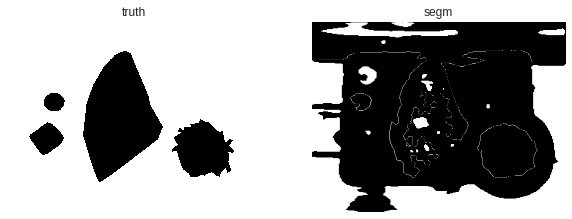

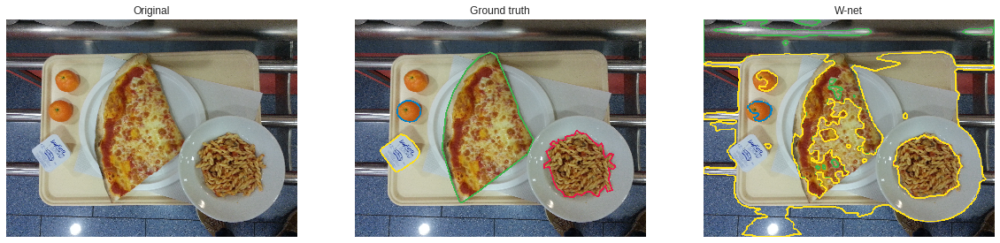

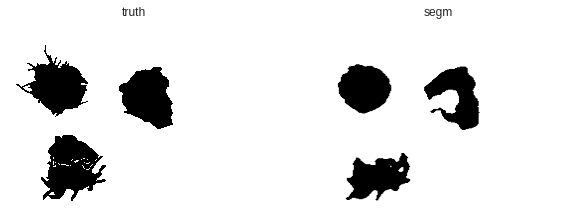

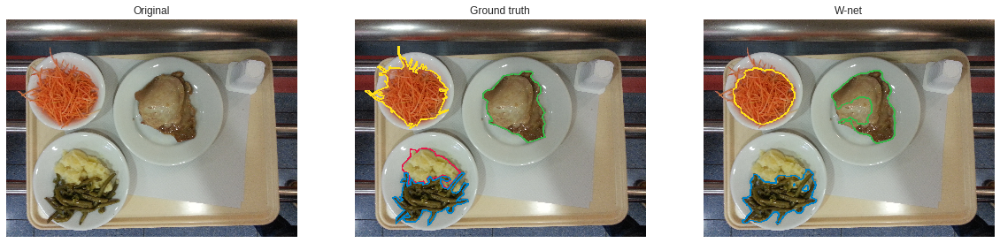

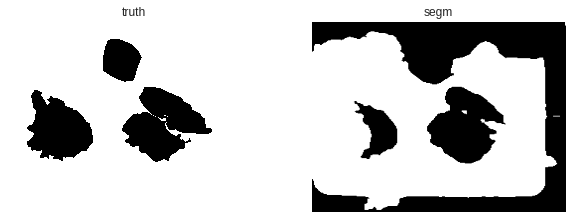

...

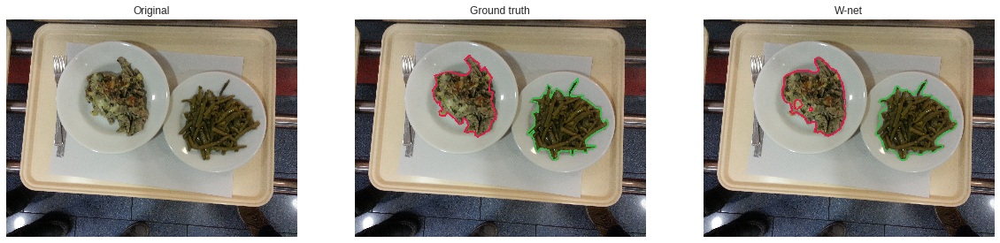

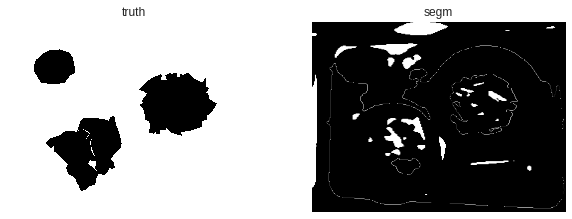

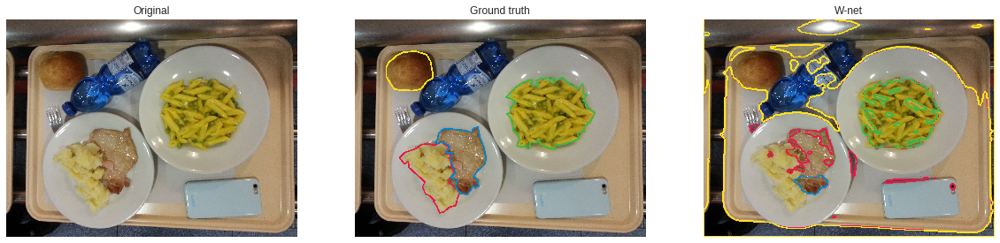

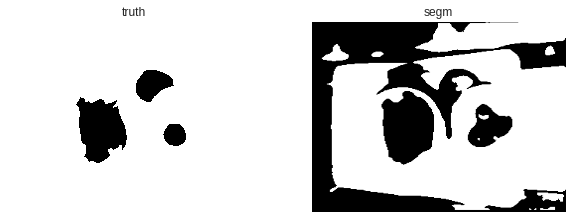

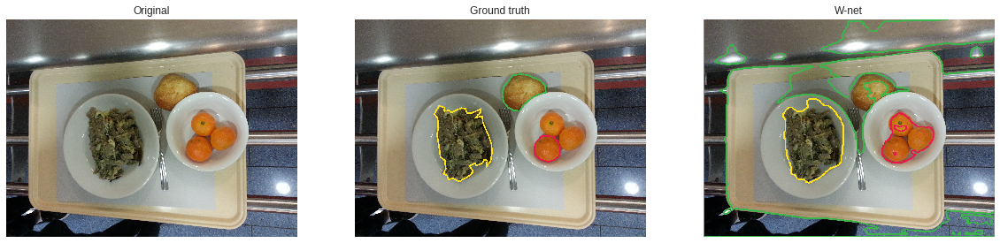

In [16]:
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  P = get_connectivity_split(img, test_images[i])
  plot_comparison_contours(test_ids[i], P)

### Plots

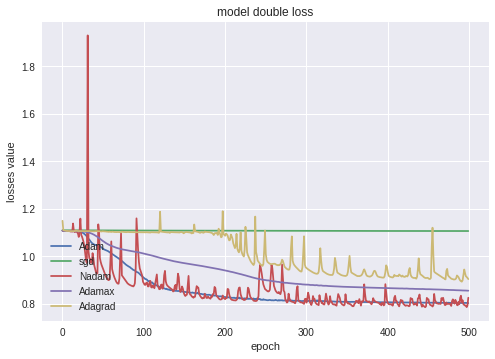

In [0]:
a = len(suma1)
plt.plot(np.arange(a),suma1)
plt.plot(np.arange(a),suma2)
plt.plot(np.arange(a),suma3)
plt.plot(np.arange(a),suma4)
plt.plot(np.arange(a),suma5)
plt.title('model double loss')
plt.ylabel('losses value')
plt.xlabel('epoch')
plt.legend(['Adam','sgd','Nadam','Adamax','Adagrad'], loc='lower left')
plt.show()

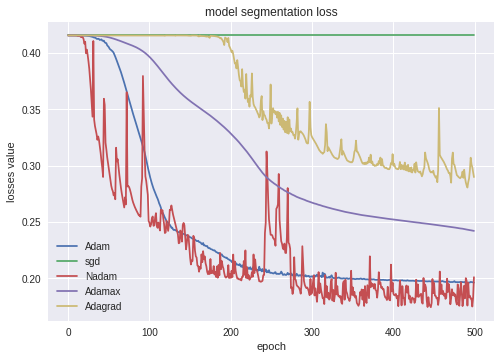

In [0]:
plt.plot(np.arange(a),segmentation1)
plt.plot(np.arange(a),segmentation2)
plt.plot(np.arange(a),segmentation3)
plt.plot(np.arange(a),segmentation4)
plt.plot(np.arange(a),segmentation5)
plt.title('model segmentation loss')
plt.ylabel('losses value')
plt.xlabel('epoch')
plt.legend(['Adam','sgd','Nadam','Adamax','Adagrad'], loc='lower left')
plt.show()

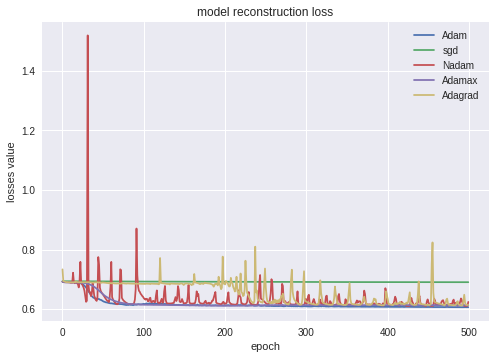

In [0]:
plt.plot(np.arange(a),reconstruction1)
plt.plot(np.arange(a),reconstruction2)
plt.plot(np.arange(a),reconstruction3)
plt.plot(np.arange(a),reconstruction4)
plt.plot(np.arange(a),reconstruction5)
plt.title('model reconstruction loss')
plt.ylabel('losses value')
plt.xlabel('epoch')
plt.legend(['Adam','sgd','Nadam','Adamax','Adagrad'], loc='upper right')
plt.show()

## Find the best initializer 

We compare He Uniform and Random Normal (with the best stardard deviation we could use) with our current results we had using He Normal

###  He Uniform

In [18]:
def get_wnet_18_32(IMG_WIDTH=256,IMG_HEIGHT=256,IMG_CHANNELS=3, k=CLASSES):#(shape, k=10)
  #IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS = shape
  keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

  inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = Lambda(lambda x: x / 255) (inputs)    
  #1
  rn = keras.initializers.RandomNormal(mean=0.0, stddev=0.5, seed=25)
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same') (s)
  conv1 = Dropout(0.2)(conv1) 
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same') (conv1)
  p1 = MaxPooling2D((2,2)) (conv1)

  #2
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(p1)
  sconv2 = Dropout(0.2)(sconv2) 
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(sconv2)
  p2 = MaxPooling2D((2,2)) (sconv2)

  #3
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(p2)
  sconv3 = Dropout(0.2)(sconv3) 
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(sconv3)
  p3 = MaxPooling2D((2, 2)) (sconv3)

  #4
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(p3)
  sconv4 = Dropout(0.2)(sconv4) 
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(sconv4)
  p4 = MaxPooling2D((2, 2)) (sconv4)

  #5
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(p4)
  sc5 = Dropout(0.2)(sc5) 
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(sc5)

  #6
  l6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc5)
  l6 = concatenate([sconv4, l6])
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l6)
  l6 = Dropout(0.2)(l6) 
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l6)

  #7
  l7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(l6)
  l7 = concatenate([sconv3, l7])
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l7)
  l7 = Dropout(0.2)(l7)
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l7)

  #8
  l8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l7)
  l8 = concatenate([sconv2, l8])
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l8)
  l8 = Dropout(0.2)(l8) 
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l8)

  #9
  l9 = Conv2DTranspose(32 ,(2, 2), strides=(2, 2), padding='same')(l8)
  l9 = concatenate([conv1, l9])
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same') (l9)
  l9 = Dropout(0.2)(l9) 
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same') (l9)
  output1 = Conv2D(k, (1, 1), activation='softmax', kernel_initializer=rn, padding='same', name='segmentation') (l9)
  #----------------------------------------------------------------------
  #soft n-cut loss
  #10
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same') (output1)
  conv10 = Dropout(0.2)(conv10) 
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same') (conv10)
  p10 = MaxPooling2D(pool_size=(2, 2))  (conv10)

  #11
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(p10)
  sconv11 = Dropout(0.2)(sconv11) 
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(sconv11)
  p11 = MaxPooling2D(pool_size=(2, 2))  (sconv11)

  #12
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(p11)
  sconv12 = Dropout(0.2)(sconv12) 
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(sconv12)
  p12 = MaxPooling2D(pool_size=(2, 2))  (sconv12)

  #13
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(p12)
  sconv13 = Dropout(0.2)(sconv13) 
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(sconv13)
  p13 = MaxPooling2D(pool_size=(2, 2)) (sconv13)

  #14
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(p13)
  sc14 = Dropout(0.2)(sc14)
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(sc14)

  #15
  l15 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc14)
  l15 = concatenate([sconv13, l15])
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l15)
  l15 = Dropout(0.2)(l15) 
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l15)

  #16
  l16 = Conv2DTranspose(128,(2, 2), strides=(2, 2), padding='same')(l15)
  l16 = concatenate([sconv12, l16])
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l16)
  l16 = Dropout(0.2)(l16) 
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l16)

  #17
  l17 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l16)
  l17 = concatenate([sconv11, l17])
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l17)
  l17 = Dropout(0.2)(l17) 
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same')(l17)

  #18
  l18 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(l17)
  l18 = concatenate([conv10, l18])
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same') (l18)
  l18 = Dropout(0.2)(l18) 
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same') (l18)
  output2 = Conv2D(3, (1, 1), activation='sigmoid', kernel_initializer='he_uniform', padding='same', name='reconstruction') (l18)
  Adagrad = keras.optimizers.Adagrad(lr=0.01, epsilon=None, decay=0.0)
  Adam = keras.optimizers.Adam(lr=0.0005, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.03)
  Nadam = keras.optimizers.Nadam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, schedule_decay=0.004)
  Adamax = keras.optimizers.Adamax(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
  model = Model(inputs=[inputs], outputs=[output1, output2])
  model.compile(optimizer=Adam,loss={'segmentation': centroids_similarity_loss, 'reconstruction': 'binary_crossentropy'}, metrics=['accuracy'])
  return model
w_net = get_wnet_18_32()

#### training

Training

In [0]:
history = w_net.fit(img[:,:,:,:3],[img, img[:,:,:,:3]],epochs=500, batch_size=10,verbose=1)

One image processing

In [0]:
for i in range(200):
  history = w_net.fit(img[:,:,:,:3],[img,img[:,:,:,:3]],epochs=1, batch_size=1,verbose=0)
  y_s = w_net.predict(img[:,:,:,:3],batch_size=1 , verbose=0)
  segm = y_s[0][0]
  rec = y_s[1][0]
  if i%30==0:
    print(i)
    paints(img[0],segm,rec)

#### prediction

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


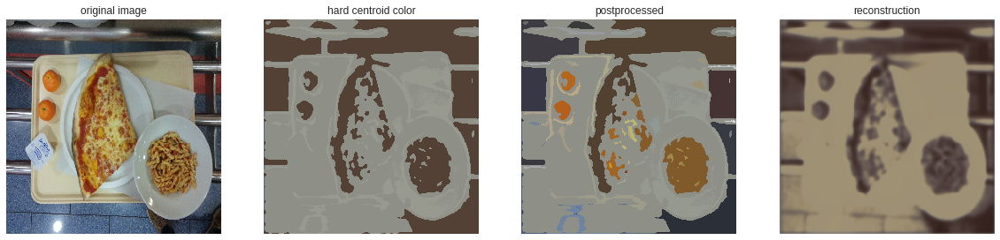

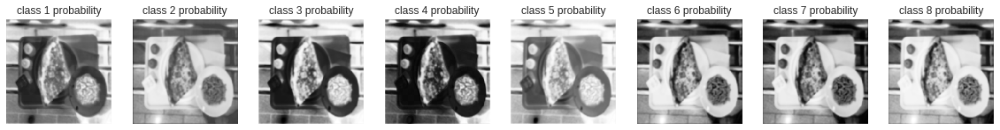

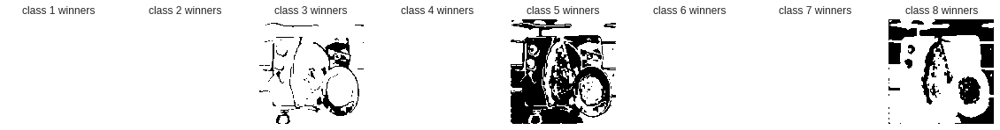

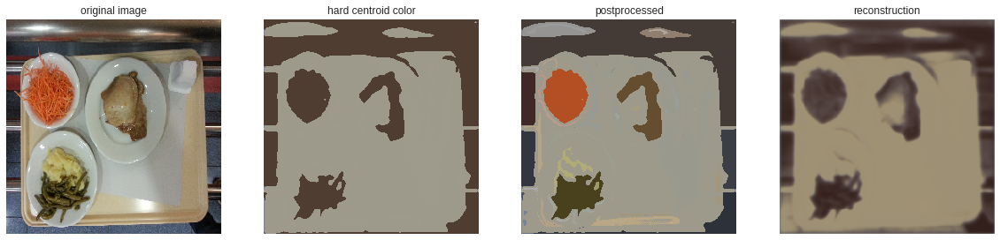

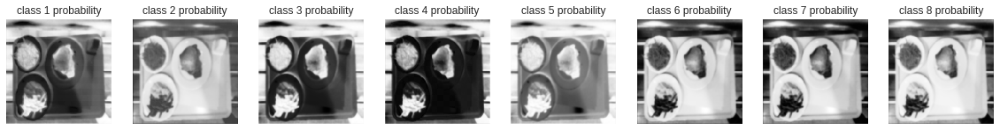

...

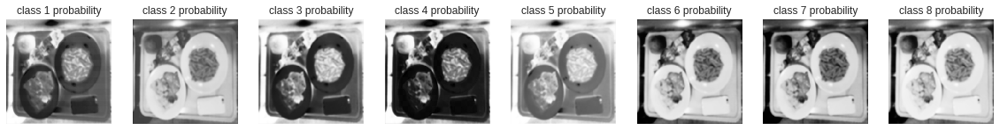

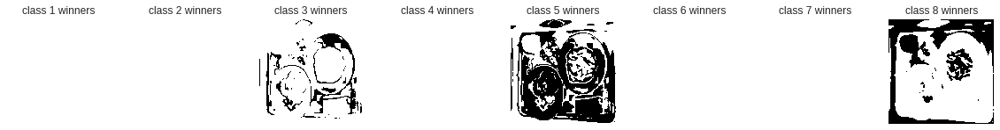

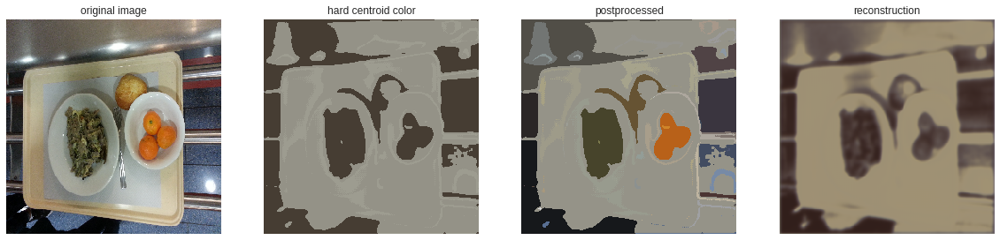

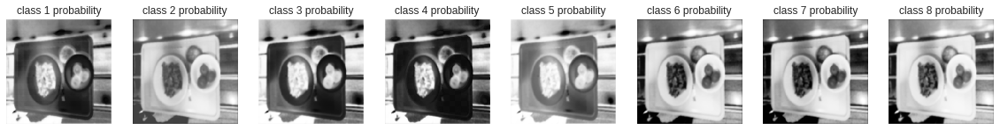

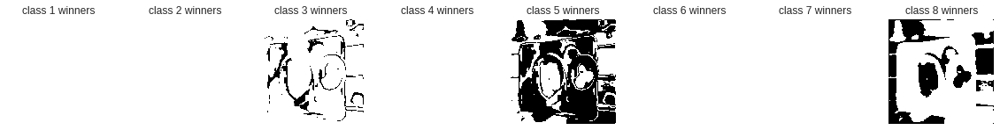

In [19]:
test_images = []
for i in [0,1,2,3,4,5,6,7]:  
  imgee = np.zeros((1,256,256,3))
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant')
  imgee[0] = im
  y_s = w_net.predict(imgee,batch_size=1)
  segm = y_s[0][0]
  rec = y_s[1][0]
  paints(imgee[0],segm,rec)
  test_images.append(segm)

#### Compute the IOU

In [22]:
suma = 0
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  len(test_images)
  suma = suma+segmentation_IOU(im, test_images[i], i)
print("IOU for W-net 18-64: {}".format(suma/8))

IOU for W-net 18-64: 0.4395861419998058


#### Contour Visualization

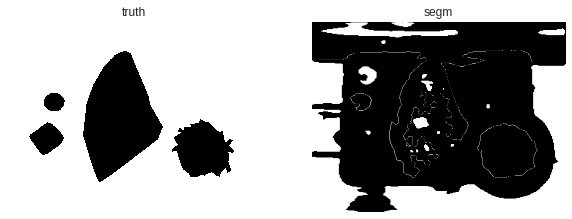

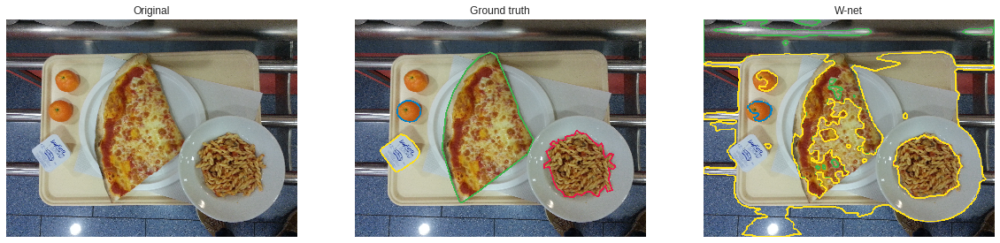

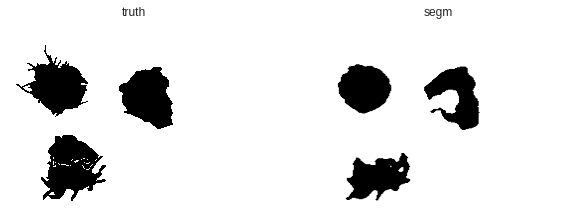

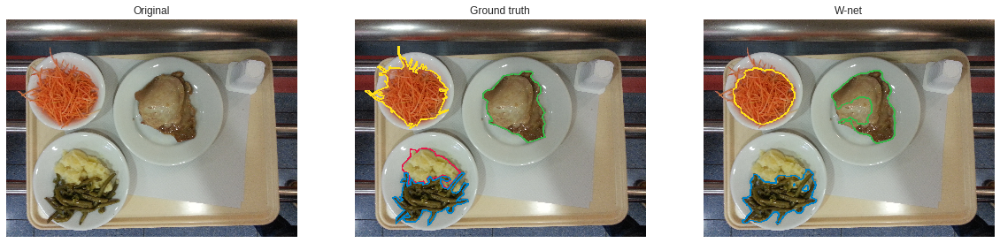

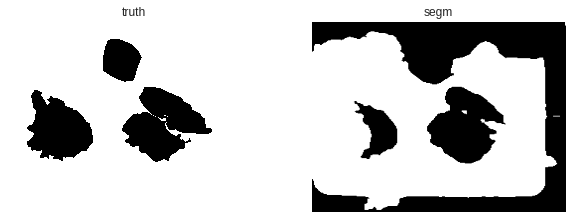

...

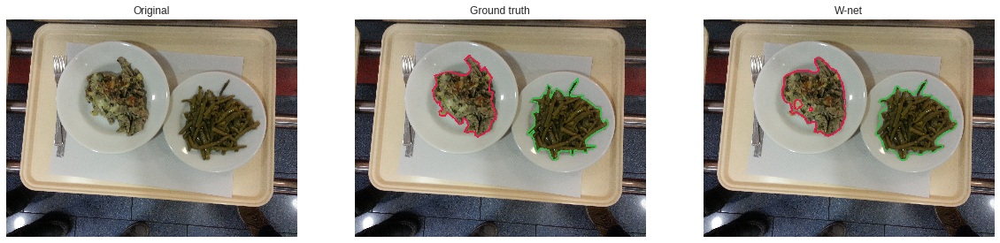

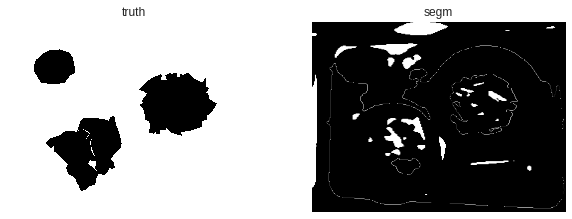

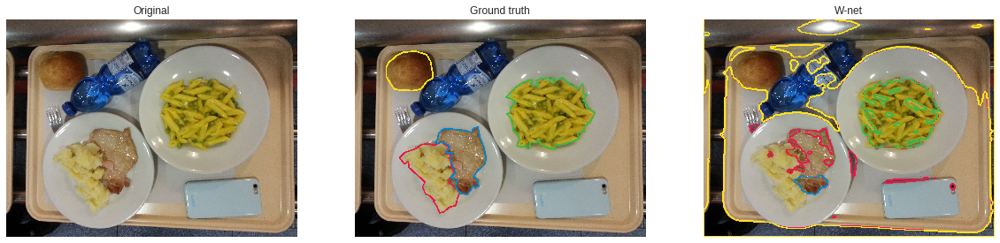

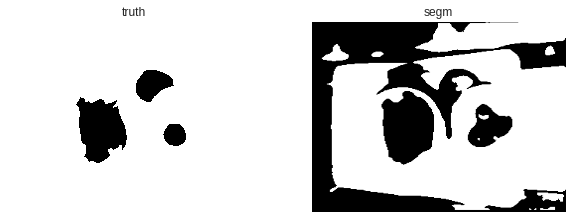

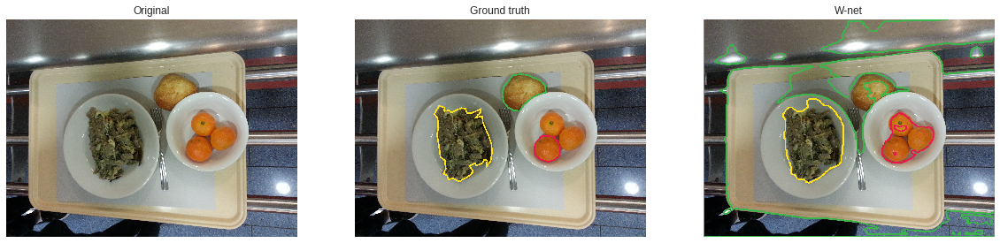

In [21]:
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  P = get_connectivity_split(img, test_images[i])
  plot_comparison_contours(test_ids[i], P)

### Random Normal

In [40]:
def get_wnet_18_32(IMG_WIDTH=256,IMG_HEIGHT=256,IMG_CHANNELS=3, k=CLASSES):#(shape, k=10)
  #IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS = shape
  keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

  inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = Lambda(lambda x: x / 255) (inputs)    
  #1
  rn = keras.initializers.RandomNormal(mean=0.0, stddev=0.5, seed=25)
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=rn, padding='same') (s)
  conv1 = Dropout(0.2)(conv1) 
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=rn, padding='same') (conv1)
  p1 = MaxPooling2D((2,2)) (conv1)

  #2
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(p1)
  sconv2 = Dropout(0.2)(sconv2) 
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(sconv2)
  p2 = MaxPooling2D((2,2)) (sconv2)

  #3
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(p2)
  sconv3 = Dropout(0.2)(sconv3) 
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(sconv3)
  p3 = MaxPooling2D((2, 2)) (sconv3)

  #4
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(p3)
  sconv4 = Dropout(0.2)(sconv4) 
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(sconv4)
  p4 = MaxPooling2D((2, 2)) (sconv4)

  #5
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(p4)
  sc5 = Dropout(0.2)(sc5) 
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(sc5)

  #6
  l6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc5)
  l6 = concatenate([sconv4, l6])
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l6)
  l6 = Dropout(0.2)(l6) 
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l6)

  #7
  l7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(l6)
  l7 = concatenate([sconv3, l7])
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l7)
  l7 = Dropout(0.2)(l7)
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l7)

  #8
  l8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l7)
  l8 = concatenate([sconv2, l8])
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l8)
  l8 = Dropout(0.2)(l8) 
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l8)

  #9
  l9 = Conv2DTranspose(32 ,(2, 2), strides=(2, 2), padding='same')(l8)
  l9 = concatenate([conv1, l9])
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=rn, padding='same') (l9)
  l9 = Dropout(0.2)(l9) 
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=rn, padding='same') (l9)
  output1 = Conv2D(k, (1, 1), activation='softmax', kernel_initializer=rn, padding='same', name='segmentation') (l9)
  #----------------------------------------------------------------------
  #soft n-cut loss
  #10
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=rn, padding='same') (output1)
  conv10 = Dropout(0.2)(conv10) 
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=rn, padding='same') (conv10)
  p10 = MaxPooling2D(pool_size=(2, 2))  (conv10)

  #11
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(p10)
  sconv11 = Dropout(0.2)(sconv11) 
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(sconv11)
  p11 = MaxPooling2D(pool_size=(2, 2))  (sconv11)

  #12
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(p11)
  sconv12 = Dropout(0.2)(sconv12) 
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(sconv12)
  p12 = MaxPooling2D(pool_size=(2, 2))  (sconv12)

  #13
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(p12)
  sconv13 = Dropout(0.2)(sconv13) 
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(sconv13)
  p13 = MaxPooling2D(pool_size=(2, 2)) (sconv13)

  #14
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(p13)
  sc14 = Dropout(0.2)(sc14)
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(sc14)

  #15
  l15 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc14)
  l15 = concatenate([sconv13, l15])
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l15)
  l15 = Dropout(0.2)(l15) 
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l15)

  #16
  l16 = Conv2DTranspose(128,(2, 2), strides=(2, 2), padding='same')(l15)
  l16 = concatenate([sconv12, l16])
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l16)
  l16 = Dropout(0.2)(l16) 
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l16)

  #17
  l17 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l16)
  l17 = concatenate([sconv11, l17])
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l17)
  l17 = Dropout(0.2)(l17) 
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer=rn, padding='same')(l17)

  #18
  l18 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(l17)
  l18 = concatenate([conv10, l18])
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=rn, padding='same') (l18)
  l18 = Dropout(0.2)(l18) 
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=rn, padding='same') (l18)
  output2 = Conv2D(3, (1, 1), activation='sigmoid', kernel_initializer=rn, padding='same', name='reconstruction') (l18)
  Adagrad = keras.optimizers.Adagrad(lr=0.01, epsilon=None, decay=0.0)
  Adam = keras.optimizers.Adam(lr=0.0005, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.03)
  Nadam = keras.optimizers.Nadam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, schedule_decay=0.004)
  Adamax = keras.optimizers.Adamax(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
  model = Model(inputs=[inputs], outputs=[output1, output2])
  model.compile(optimizer=Adam,loss={'segmentation': centroids_similarity_loss, 'reconstruction': 'binary_crossentropy'}, metrics=['accuracy'])
  return model
w_net = get_wnet_18_32()

#### training 

Training

In [0]:
history = w_net.fit(img[:,:,:,:3],[img, img[:,:,:,:3]],epochs=500, batch_size=10,verbose=1)

One image processing

In [0]:
for i in range(300):
  history = w_net.fit(img[:,:,:,:3],[img,img[:,:,:,:3]],epochs=1, batch_size=1,verbose=0)
  y_s = w_net.predict(img[:,:,:,:3],batch_size=1 , verbose=0)
  segm = y_s[0][0]
  rec = y_s[1][0]
  losses = w_net.evaluate(img[:,:,:,:3],[img,img[:,:,:,:3]], batch_size=1,verbose=0)
  if i%100==0:
    print(i)
    paints(img[0],segm,rec)

#### prediction

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


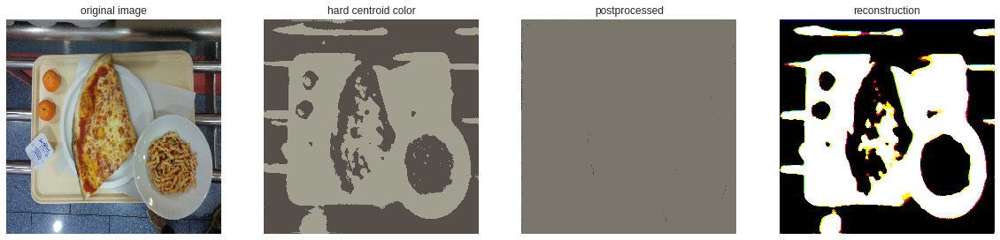

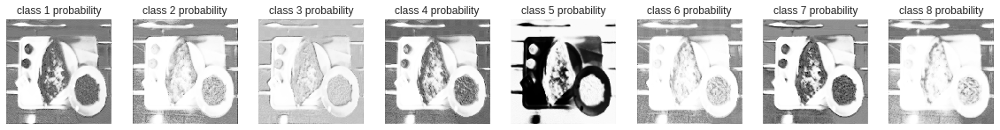

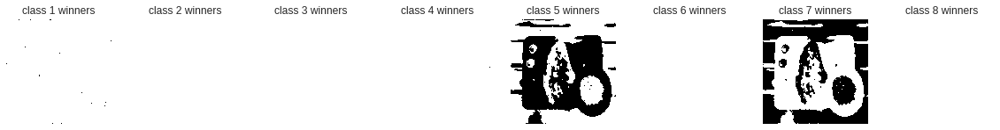

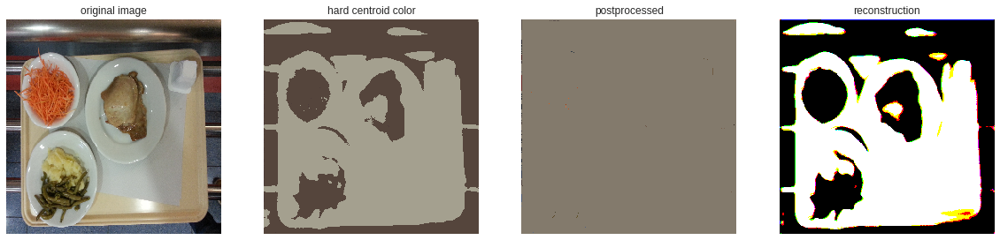

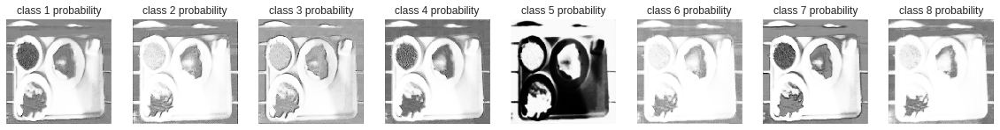

...

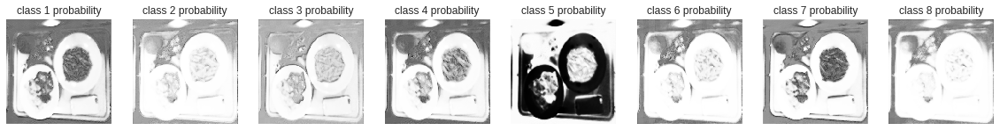

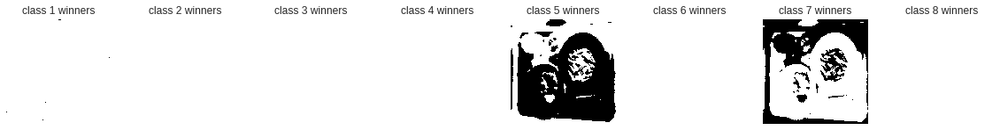

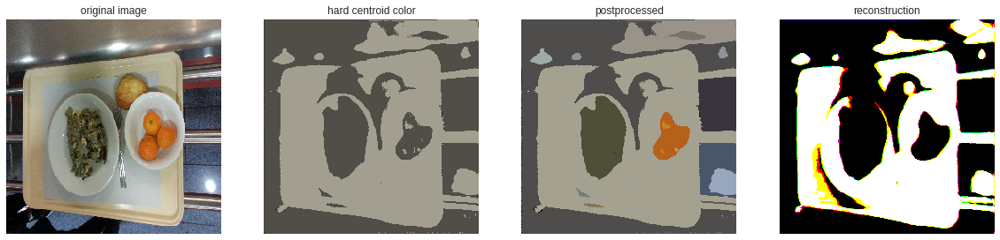

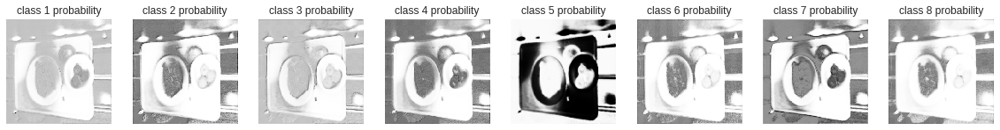

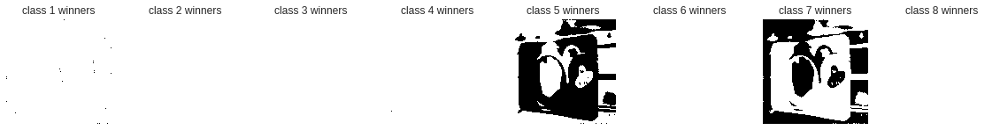

In [0]:
for i in [0,1,2,3,4,5,6,7]:  
  imgee = np.zeros((1,256,256,3))
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant')
  imgee[0] = im
  y_s = w_net.predict(imgee,batch_size=1)
  segm = y_s[0][0]
  rec = y_s[1][0]
  paints(imgee[0],segm,rec)

#### Contour Visualization

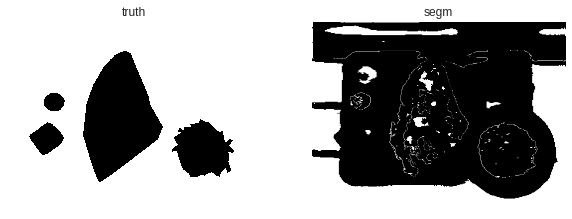

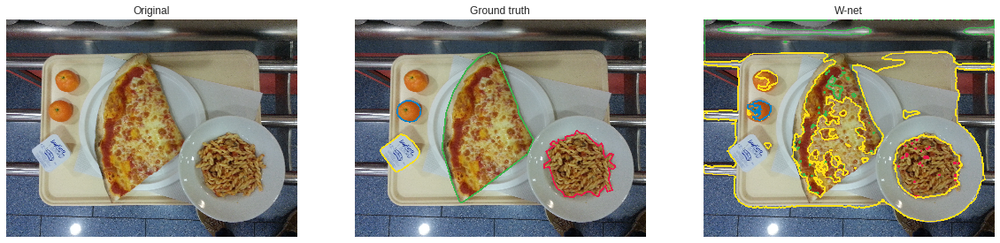

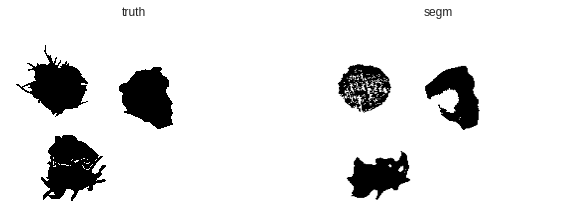

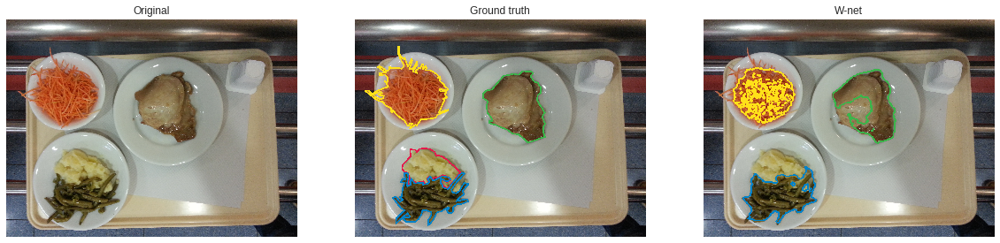

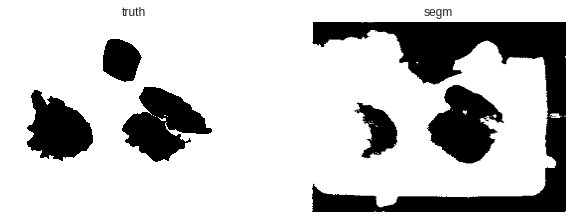

...

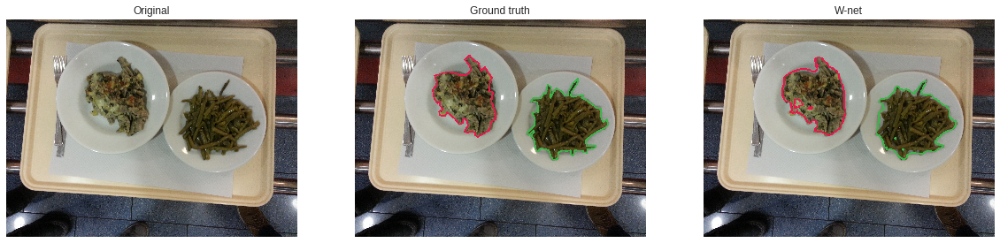

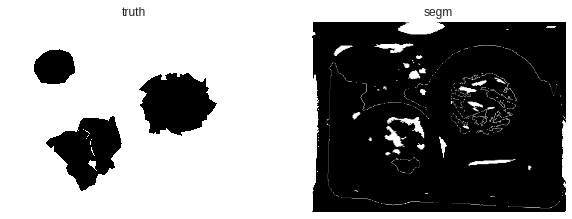

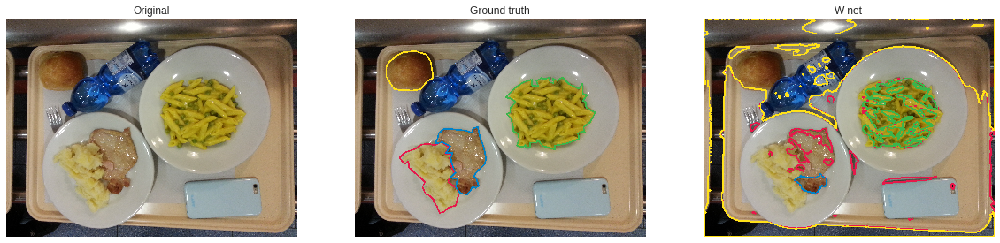

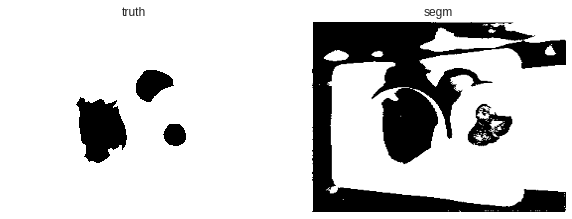

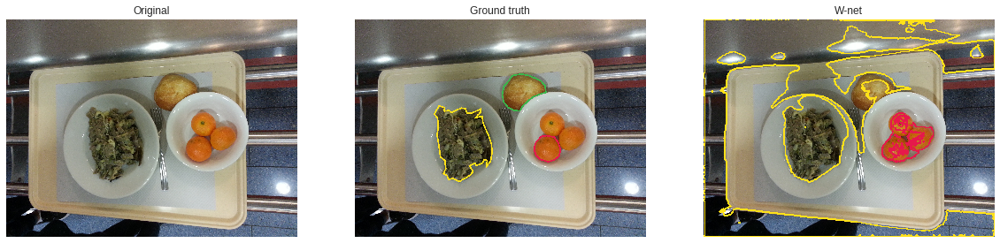

In [44]:
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  P = get_connectivity_split(img, test_images[i])
  plot_comparison_contours(test_ids[i], P)

#### Compute the IOU

In [26]:
suma = 0
for i in [0,1,2,3,4,5,6,7]: 
  im = imread('data/original/' + test_ids[i] + '.jpg')[:,:,:3]
  im = resize(im, (256, 256), mode='constant') 
  len(test_images)
  suma = suma+segmentation_IOU(im, test_images[i], 0)
print("IOU for W-net 18-64: {}".format(suma/8))

IOU for W-net 18-64: 0.14255821780779537


### From all the test we made we conclude that the best model is using the W-net 18-32 with adam and He Normal

## Visualise the classification of the best combination  in 3D

We will vizualise the the image below which was predicted with our best model into a 3D dimensional space with x=R, y=G, z=B. The colour of the point  for the first plot is colours of the pixels in of the original image, for the second the colour of the  centroid where this pixel belongs and for the third plot the colour of the pixels after postprocessing 

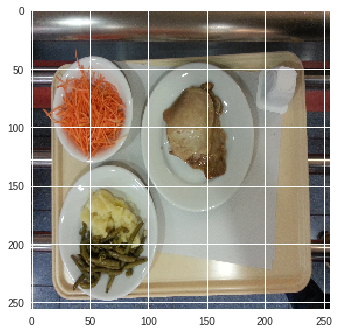

In [24]:
im = imread('data/original/' + test_ids[1] + '.jpg')[:,:,:3]
im = resize(im, (256, 256), mode='constant')
plt.imshow(im)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:127: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:118: RuntimeWarning: invalid value encountered in true_divide


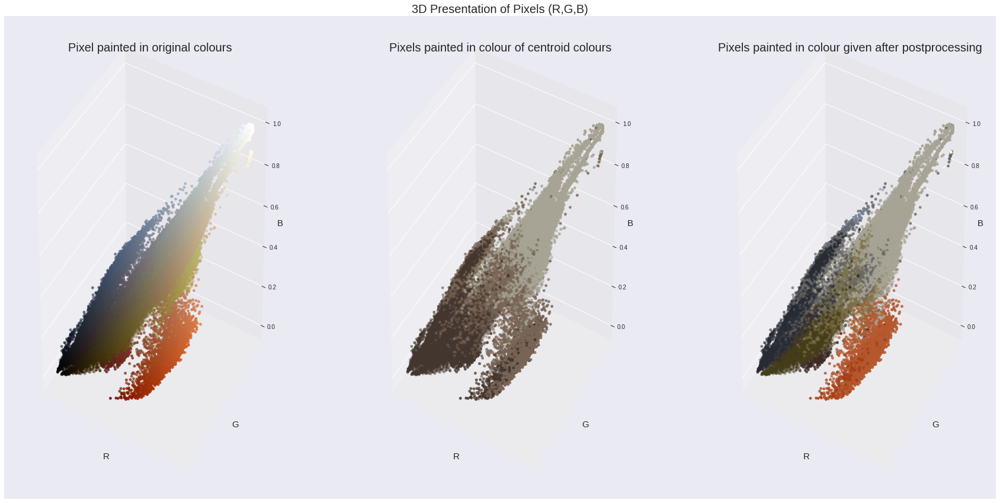

In [23]:
hard_centroid_pixel_scatter3D(img[0],segm)

## Testing our model with a image from the W-net paper

In [24]:
from google.colab import files

uploaded = files.upload()

Saving Capture1.PNG to Capture1 (1).PNG


We will now test or model how it processes one image of the paper [W-net](https://arxiv.org/abs/1711.08506).

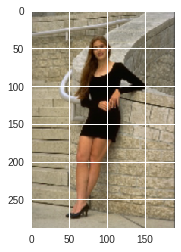

In [25]:
import matplotlib.image as mpimg
import matplotlib.pylab as plt
import numpy as np
%matplotlib inline
from IPython.display import clear_output

im = mpimg.imread("Capture1.PNG")
im.setflags(write = 1)
plt.imshow(im)
plt.show()

In [26]:
im.shape

(288, 190, 4)

In [32]:
def get_wnet_18_32(IMG_WIDTH=256,IMG_HEIGHT=256,IMG_CHANNELS=3, k=CLASSES):#(shape, k=10)
  #IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS = shape
  keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

  inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = Lambda(lambda x: x / 255) (inputs)    
  #1
  rn = keras.initializers.RandomNormal(mean=0.0, stddev=0.5, seed=25)
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (s)
  conv1 = Dropout(0.2)(conv1) 
  conv1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv1)
  p1 = MaxPooling2D((2,2)) (conv1)

  #2
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  sconv2 = Dropout(0.2)(sconv2) 
  sconv2 =SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv2)
  p2 = MaxPooling2D((2,2)) (sconv2)

  #3
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  sconv3 = Dropout(0.2)(sconv3) 
  sconv3 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv3)
  p3 = MaxPooling2D((2, 2)) (sconv3)

  #4
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  sconv4 = Dropout(0.2)(sconv4) 
  sconv4 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv4)
  p4 = MaxPooling2D((2, 2)) (sconv4)

  #5
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  sc5 = Dropout(0.2)(sc5) 
  sc5 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc5)

  #6
  l6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc5)
  l6 = concatenate([sconv4, l6])
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)
  l6 = Dropout(0.2)(l6) 
  l6 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l6)

  #7
  l7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(l6)
  l7 = concatenate([sconv3, l7])
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)
  l7 = Dropout(0.2)(l7)
  l7 = SeparableConv2D(128 , (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l7)

  #8
  l8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l7)
  l8 = concatenate([sconv2, l8])
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)
  l8 = Dropout(0.2)(l8) 
  l8 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l8)

  #9
  l9 = Conv2DTranspose(32 ,(2, 2), strides=(2, 2), padding='same')(l8)
  l9 = concatenate([conv1, l9])
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  l9 = Dropout(0.2)(l9) 
  l9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l9)
  output1 = Conv2D(k, (1, 1), activation='softmax', kernel_initializer=rn, padding='same', name='segmentation') (l9)
  #----------------------------------------------------------------------
  #soft n-cut loss
  #10
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (output1)
  conv10 = Dropout(0.2)(conv10) 
  conv10 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (conv10)
  p10 = MaxPooling2D(pool_size=(2, 2))  (conv10)

  #11
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p10)
  sconv11 = Dropout(0.2)(sconv11) 
  sconv11 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv11)
  p11 = MaxPooling2D(pool_size=(2, 2))  (sconv11)

  #12
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p11)
  sconv12 = Dropout(0.2)(sconv12) 
  sconv12 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv12)
  p12 = MaxPooling2D(pool_size=(2, 2))  (sconv12)

  #13
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p12)
  sconv13 = Dropout(0.2)(sconv13) 
  sconv13 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sconv13)
  p13 = MaxPooling2D(pool_size=(2, 2)) (sconv13)

  #14
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p13)
  sc14 = Dropout(0.2)(sc14)
  sc14 = SeparableConv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(sc14)

  #15
  l15 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(sc14)
  l15 = concatenate([sconv13, l15])
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)
  l15 = Dropout(0.2)(l15) 
  l15 = SeparableConv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l15)

  #16
  l16 = Conv2DTranspose(128,(2, 2), strides=(2, 2), padding='same')(l15)
  l16 = concatenate([sconv12, l16])
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)
  l16 = Dropout(0.2)(l16) 
  l16 = SeparableConv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l16)

  #17
  l17 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(l16)
  l17 = concatenate([sconv11, l17])
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)
  l17 = Dropout(0.2)(l17) 
  l17 = SeparableConv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(l17)

  #18
  l18 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(l17)
  l18 = concatenate([conv10, l18])
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  l18 = Dropout(0.2)(l18) 
  l18 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same') (l18)
  output2 = Conv2D(3, (1, 1), activation='sigmoid', kernel_initializer='he_normal', padding='same', name='reconstruction') (l18)
  Adagrad = keras.optimizers.Adagrad(lr=0.01, epsilon=None, decay=0.0)
  Adam = keras.optimizers.Adam(lr=0.0005, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.03)
  Nadam = keras.optimizers.Nadam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, schedule_decay=0.004)
  Adamax = keras.optimizers.Adamax(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
  model = Model(inputs=[inputs], outputs=[output1, output2])
  model.compile(optimizer=Adam,loss={'segmentation': centroids_similarity_loss, 'reconstruction': 'binary_crossentropy'}, metrics=['accuracy'])
  return model

In [0]:
w_net = get_wnet_18_32()

#### Get image

In [33]:
img = np.zeros((1,256,256,3))
i=5
im = imread('Capture1.PNG')[:,:,:3]
im = resize(im, (256, 256), mode='constant')
img[0] = im

#### One image processing

0


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


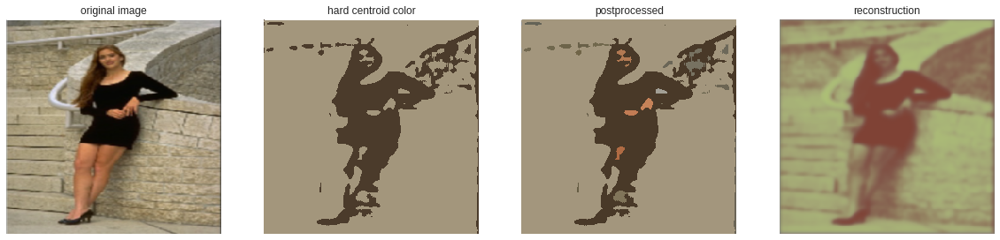

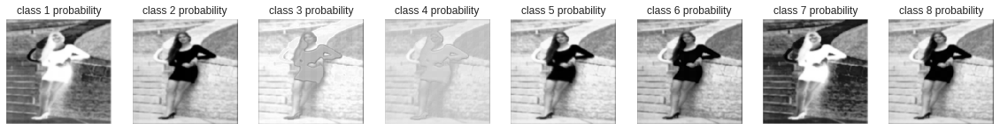

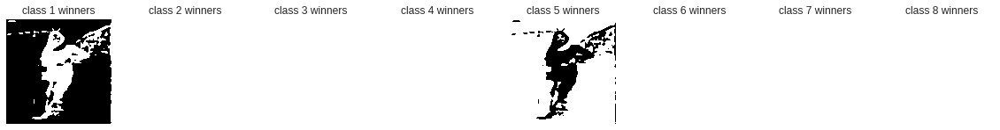

20


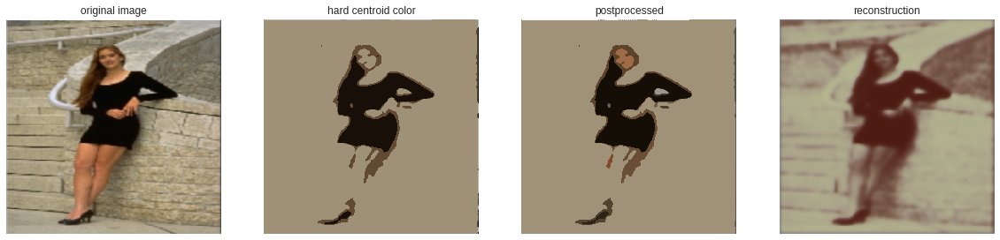

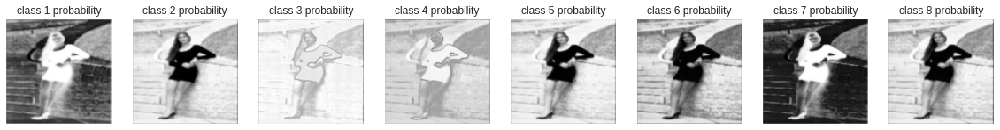

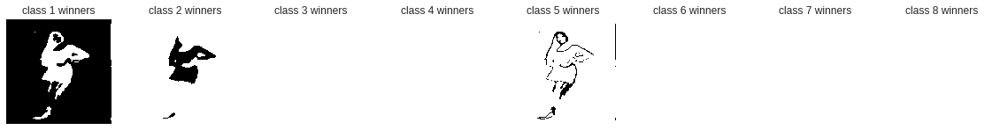

40


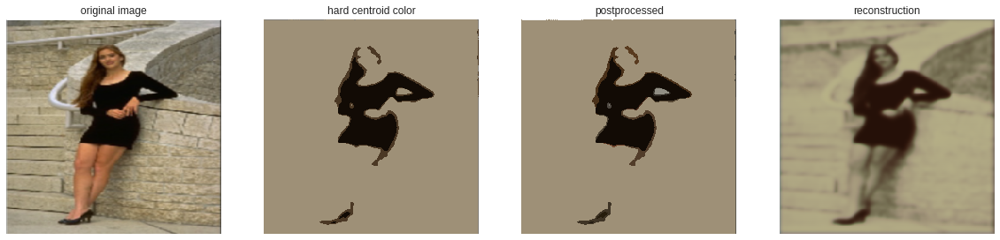

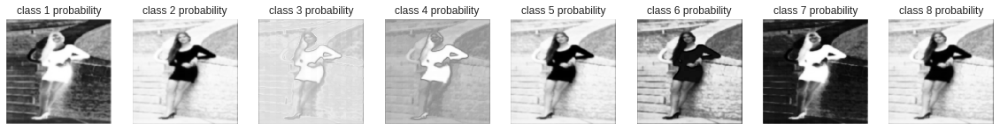

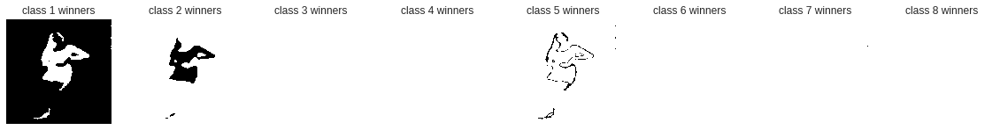

60


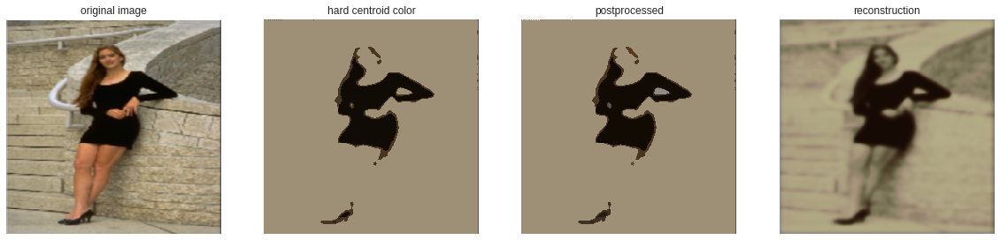

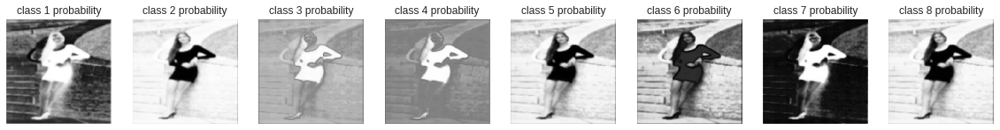

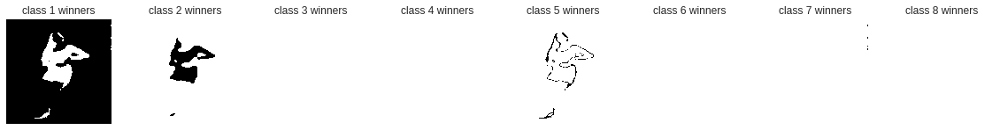

80


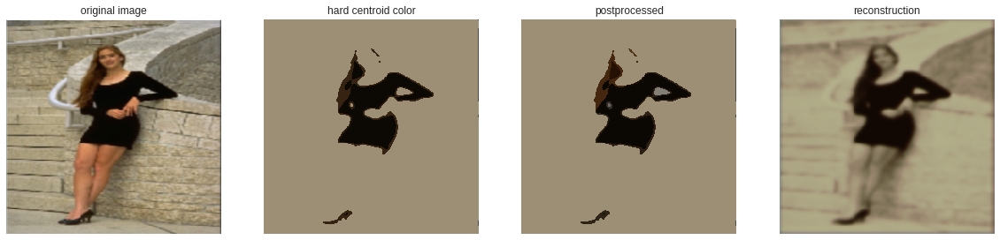

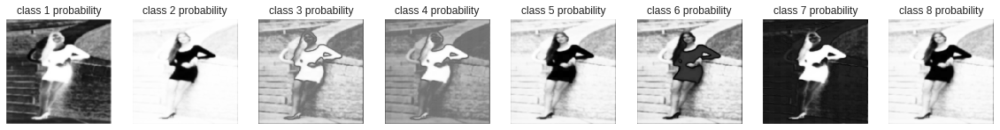

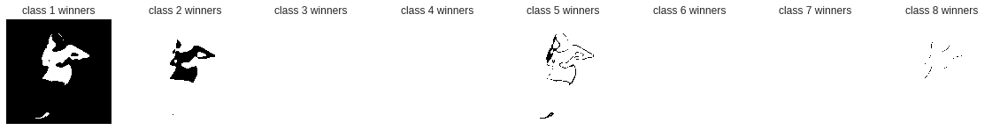

In [35]:
for i in range(100):
  history = w_net.fit(img[:,:,:,:3],[img,img[:,:,:,:3]],epochs=1, batch_size=1,verbose=0)
  y_s = w_net.predict(img[:,:,:,:3],batch_size=1 , verbose=0)
  segm = y_s[0][0]
  rec = y_s[1][0]
  losses = w_net.evaluate(img[:,:,:,:3],[img,img[:,:,:,:3]], batch_size=1,verbose=0)
  if i%20==0:
    print(i)
    paints(img[0],segm,rec)